# 04 Examination of possible covariates to include in models
includes aging effects

# read in and clean data

In [41]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import openpyxl; 
import numpy as np;
import pandas as pd;
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import pickle
import scipy
import itertools
from sklearn import preprocessing 

import warnings
warnings.filterwarnings( "ignore", module = "plotnine\..*" ) # only include this once finished and want to create nicer figures for pdf

In [42]:
data_folder_loc = "//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/"
code_folder_loc = "//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/"

In [43]:
# read in data
data_FDG_rr_orig_merge, data_FDG_rr_pons_merge, data_FDG_rr_para_merge, data_FDG_rr_para_new_merge, data_FDG_rr_ras_new_merge = pd.read_pickle(code_folder_loc + '/output/01_newdata.pkl')

In [44]:
data_FDG_rr_orig_merge['Group4'] = data_FDG_rr_orig_merge['Group3'].replace({'Riluzole':'Riluzole Trial Participants', 'Placebo':'Riluzole Trial Participants'})
data_FDG_rr_pons_merge['Group4'] = data_FDG_rr_pons_merge['Group3'].replace({'Riluzole':'Riluzole Trial Participants', 'Placebo':'Riluzole Trial Participants'})
data_FDG_rr_para_merge['Group4'] = data_FDG_rr_para_merge['Group3'].replace({'Riluzole':'Riluzole Trial Participants', 'Placebo':'Riluzole Trial Participants'})
data_FDG_rr_para_new_merge['Group4'] = data_FDG_rr_para_new_merge['Group3'].replace({'Riluzole':'Riluzole Trial Participants', 'Placebo':'Riluzole Trial Participants'})
data_FDG_rr_ras_new_merge['Group4'] = data_FDG_rr_ras_new_merge['Group3'].replace({'Riluzole':'Riluzole Trial Participants', 'Placebo':'Riluzole Trial Participants'})


In [45]:
all_data = data_FDG_rr_para_new_merge.copy()

In [46]:
all_data['Subject_ID'].sort_values().unique()

array(['APE-792-001', 'APE-792-005', 'APE-792-007', 'APE-792-009',
       'APE-792-010', 'APE-792-011', 'APE-792-013', 'APE-792-016',
       'APE-792-018', 'APE-792-020', 'APE-792-022', 'APE-792-026',
       'APE-792-027', 'APE-792-033', 'APE-792-034', 'APE-792-036',
       'APE-792-046', 'APE-792-047', 'APE-792-050', 'APE-792-053',
       'APE-792-056', 'APE-792-058', 'APE-792-062', 'APE-792-065',
       'APE-792-066', 'APE-792-071', 'RIL-001', 'RIL-002', 'RIL-003',
       'RIL-007', 'RIL-009', 'RIL-010', 'RIL-011', 'RIL-012', 'RIL-013',
       'RIL-014', 'RIL-015', 'RIL-017', 'RIL-018', 'RIL-019', 'RIL-020',
       'RIL-022', 'RIL-024', 'RIL-025', 'RIL-027', 'RIL-028', 'RIL-029',
       'RIL-031', nan], dtype=object)

In [47]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'RASref1_gm', 'Temp_gm', 'Paracentral_gm', 'R_Hip', 'PostCing_gm']

plasma_columns = [ 'Ab40', 'Ab42', 'Ab42_40', 'GFAP','NFL',  'pTau181', 'pTau217',  'pTau231', 'pTau181_Ab42', 'GFAP_aa', 'NFL_aa']
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Ventricles_Lz',
       'VOL_Ventricles_Rz', 'VOL_Putamen_Lz', 'VOL_Putamen_Rz',
       'VOL_ParaHip_Lz', 'VOL_ParaHip_Rz', 'VOL_Fusi_Lz', 'VOL_Fusi_Rz',
       'VOL_InfTemp_Lz', 'VOL_InfTemp_Rz', 'VOL_MidTemp_Lz', 'VOL_MidTemp_Rz',
       'VOL_SupTemp_Lz', 'VOL_SupTemp_Rz', 'VOL_Precun_Lz', 'VOL_Precun_Rz',
       'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_ParaPostCentr_Lz',
       'VOL_ParaPostCentr_Rz', 'VOL_SupraMarg_Lz', 'VOL_SupraMarg_Rz',
       'VOL_SupPar_Lz', 'VOL_SupPar_Rz', 'VOL_OrbitFront_Lz',
       'VOL_OrbitFront_Rz', 'VOL_Insula_Lz', 'VOL_Insula_Rz',
       'VOL_InfFront_Lz', 'VOL_InfFront_Rz', 'VOL_MidFront_Lz',
       'VOL_MidFront_Rz', 'VOL_SupFront_Lz', 'VOL_SupFront_Rz',
       'VOL_PrecFront_Lz', 'VOL_PrecFront_Rz', 'VOL_LatOcc_Lz',
       'VOL_LatOcc_Rz', 'VOL_Lingual_Lz', 'VOL_Lingual_Rz', 'VOL_Cuneus_Lz',
       'VOL_Cuneus_Rz', 'VOL_Pericalc_Lz', 'VOL_Pericalc_Rz',
       'VOL_AntCingulate_Lz', 'VOL_AntCingulate_Rz', 'VOL_PostCingulate_Lz',
       'VOL_PostCingulate_Rz', 'VOL_Entorhinal_Lz', 'VOL_Entorhinal_Rz',
       'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_TotalGray_Lz',
       'VOL_TotalGray_Rz', 'VOL_LatTemp_Lz', 'VOL_LatTemp_Rz',
       'VOL_Parietal_Lz', 'VOL_Parietal_Rz', 'VOL_Frontal_Lz',
       'VOL_Frontal_Rz', 'VOL_InfMidTemp_Lz', 'VOL_InfMidTemp_Rz',
       'VOL_InfInsFrontal_Lz', 'VOL_InfInsFrontal_Rz', 'VOL_MidSupFrontal_Lz',
       'VOL_MidSupFrontal_Rz', 'VOL_Inf_Mid_Fus_Temp_Lz',
       'VOL_Inf_Mid_Fus_Temp_Rz', 'VOL_Precun_InfPar_Lz',
       'VOL_Precun_InfPar_Rz', 'VOL_Precun_InfPar_Supramarg_Lz',
       'VOL_Precun_InfPar_Supramarg_Rz', 'VOL_LatOccLingCun_Lz',
       'VOL_LatOccLingCun_Rz', 'VOL_InfParSupra_Lz', 'VOL_InfParSupra_Rz']



In [48]:
# make data subsets
placebo_data = all_data[all_data['Group'].isin(['Placebo'])]
baseline_data = all_data[all_data['Group2'].isin(['Riluzole Trial Participants']) & all_data['timepoint'].isin(['base'])]
placebo_baseline_data = all_data[(all_data['Group2'].isin(['Riluzole Trial Participants']) & all_data['timepoint'].isin(['base']) ) | all_data['Group'].isin(['Placebo'])]

placebo_data_70_80 = placebo_data[(placebo_data['age']<=80) & (placebo_data['age']>=70)]
baseline_data_70_80 = baseline_data[(baseline_data['age']<=80) & (baseline_data['age']>=70)]

In [49]:
baseline_data.loc[baseline_data['ID_ADM'].isin(['RIL_12']), plasma_columns + log10_plasma_columns]

,Ab40,Ab42,Ab42_40,GFAP,NFL,pTau181,pTau217,pTau231,pTau181_Ab42,GFAP_aa,...,Ab42_log10,Ab42_40_log10,GFAP_log10,NFL_log10,pTau181_log10,pTau217_log10,pTau231_log10,pTau181_Ab42_log10,GFAP_aa_log10,NFL_aa_log10
218,92.5,3.79,0.040973,215.0,29.0,3.49,0.93,6.52971,0.920844,194.104294,...,0.578639,-1.387503,2.332438,1.462398,0.542825,-0.031517,0.814894,-0.035814,2.288035,1.371562


In [50]:
baseline_data['ID_ADM'].sort_values().unique()

array(['APE-792_1', 'APE-792_10', 'APE-792_11', 'APE-792_13',
       'APE-792_16', 'APE-792_18', 'APE-792_20', 'APE-792_26',
       'APE-792_27', 'APE-792_33', 'APE-792_34', 'APE-792_36',
       'APE-792_46', 'APE-792_47', 'APE-792_5', 'APE-792_50',
       'APE-792_53', 'APE-792_56', 'APE-792_58', 'APE-792_62',
       'APE-792_66', 'APE-792_7', 'RIL_1', 'RIL_10', 'RIL_11', 'RIL_12',
       'RIL_14', 'RIL_15', 'RIL_18', 'RIL_19', 'RIL_2', 'RIL_20',
       'RIL_22', 'RIL_25', 'RIL_27', 'RIL_28', 'RIL_29', 'RIL_3',
       'RIL_31', 'RIL_7', 'RIL_9'], dtype=object)

# Aging Effects - including ADRC controls

In [51]:
all_data['Group4'] = all_data['Group4'].astype('category').cat.reorder_categories(['Riluzole Trial Participants', 'ADRC Control', 'Sleep Study Control'])

## plasma
none significant

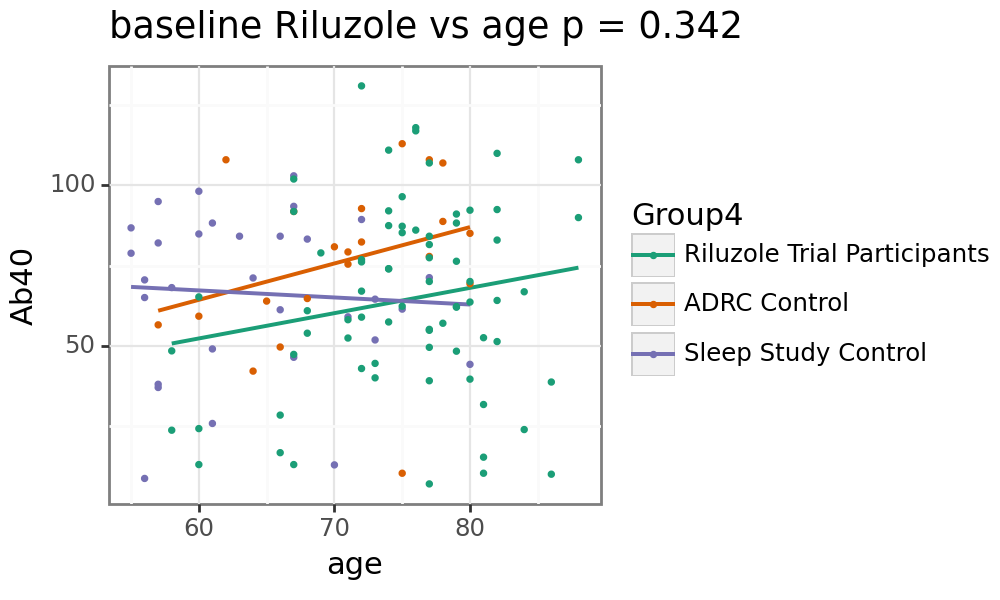

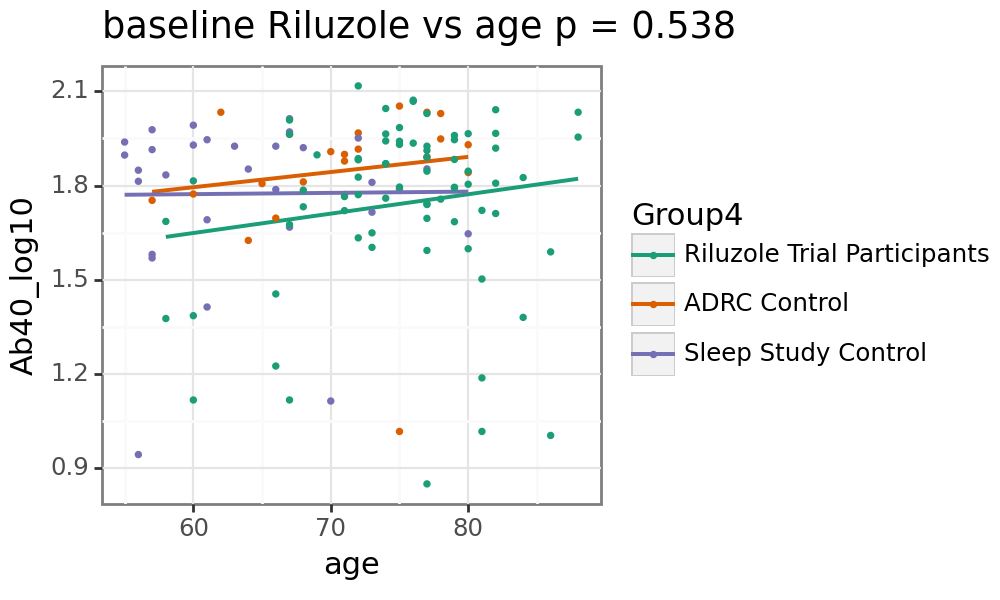

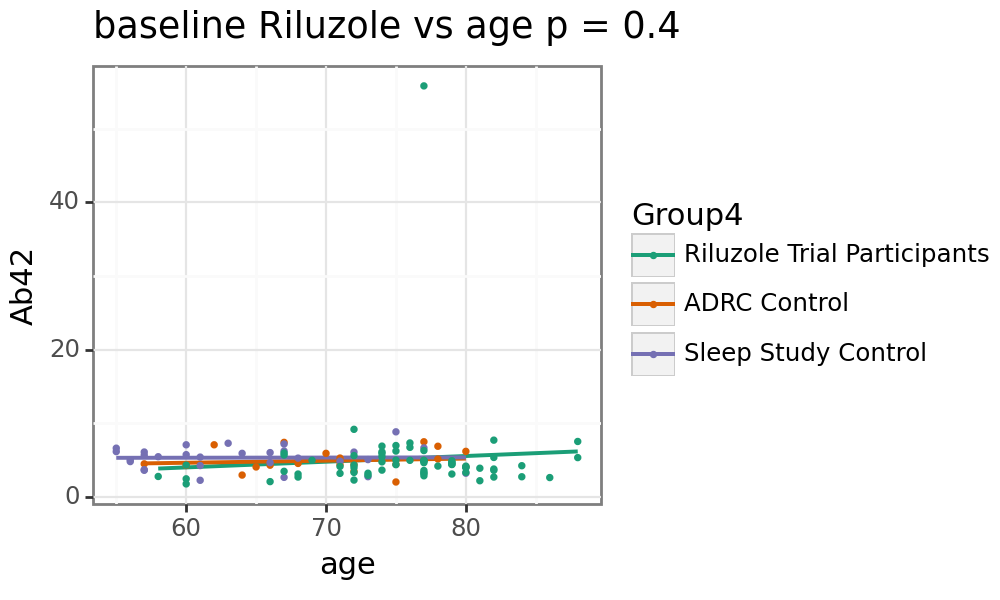

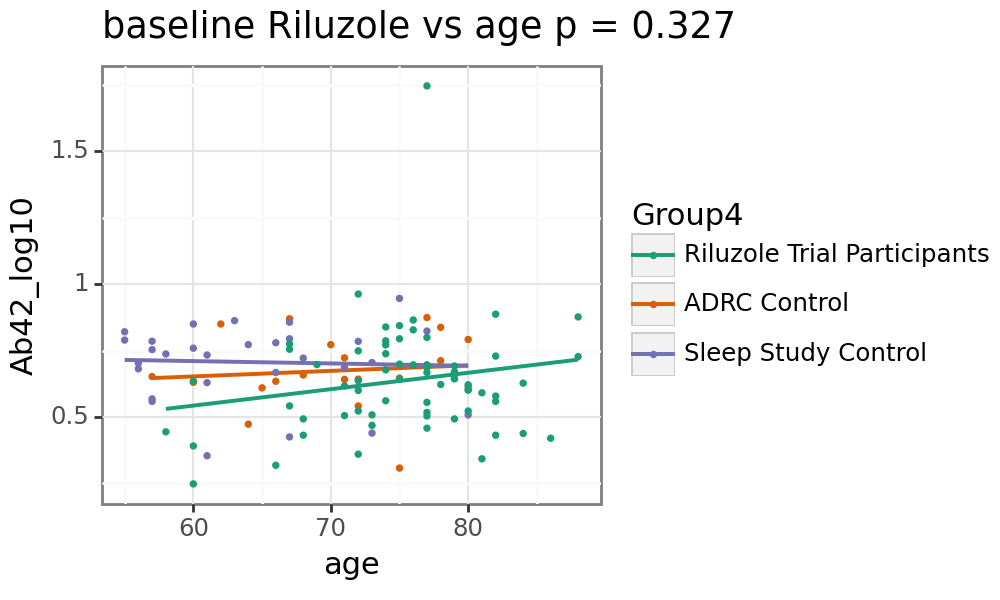

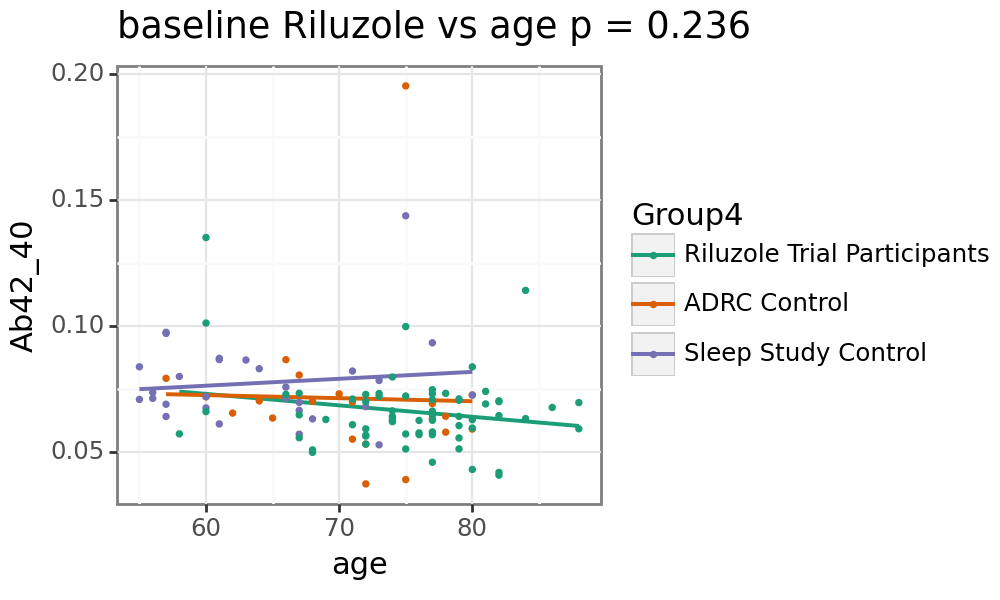

...

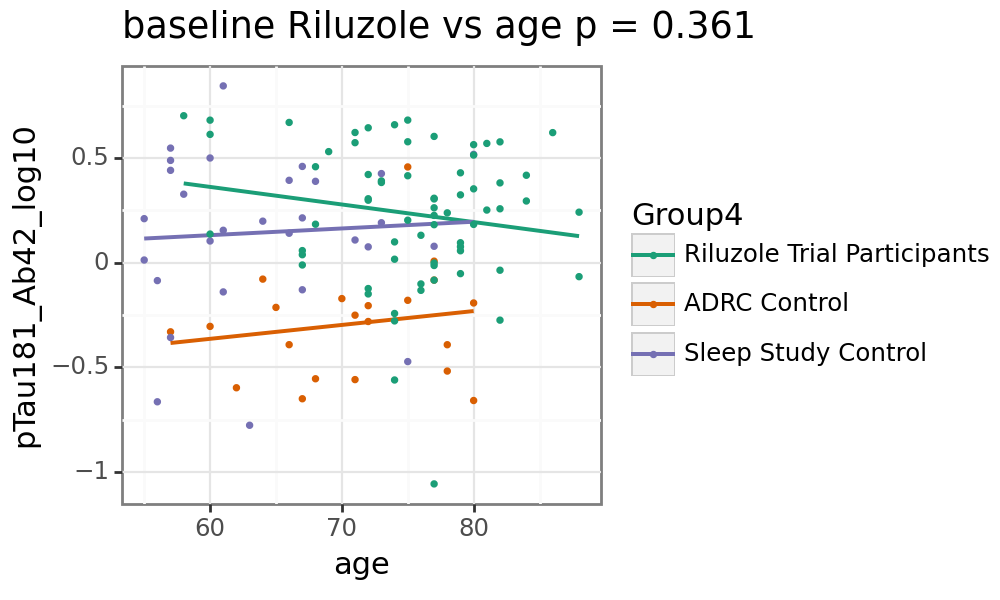

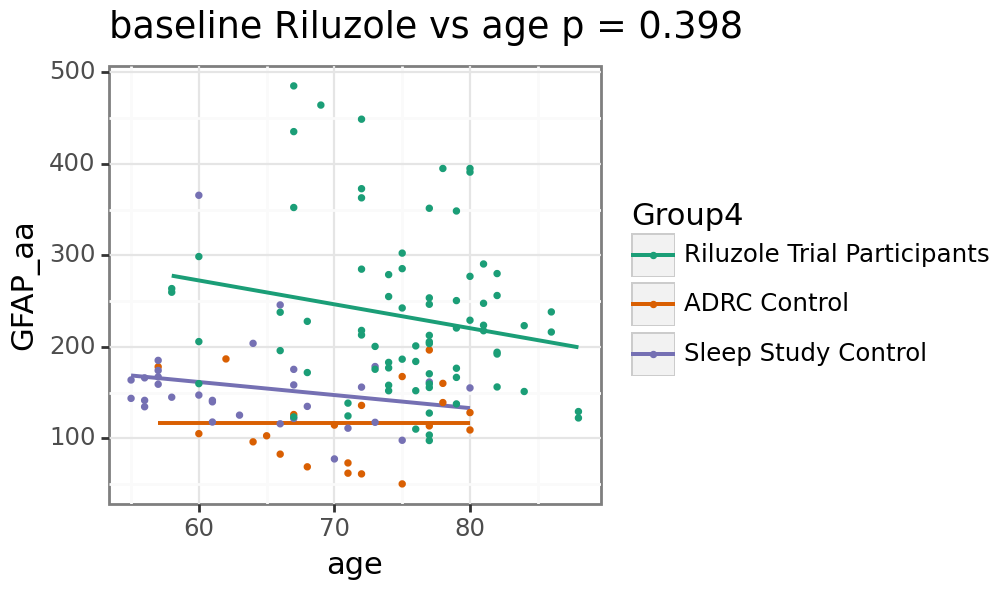

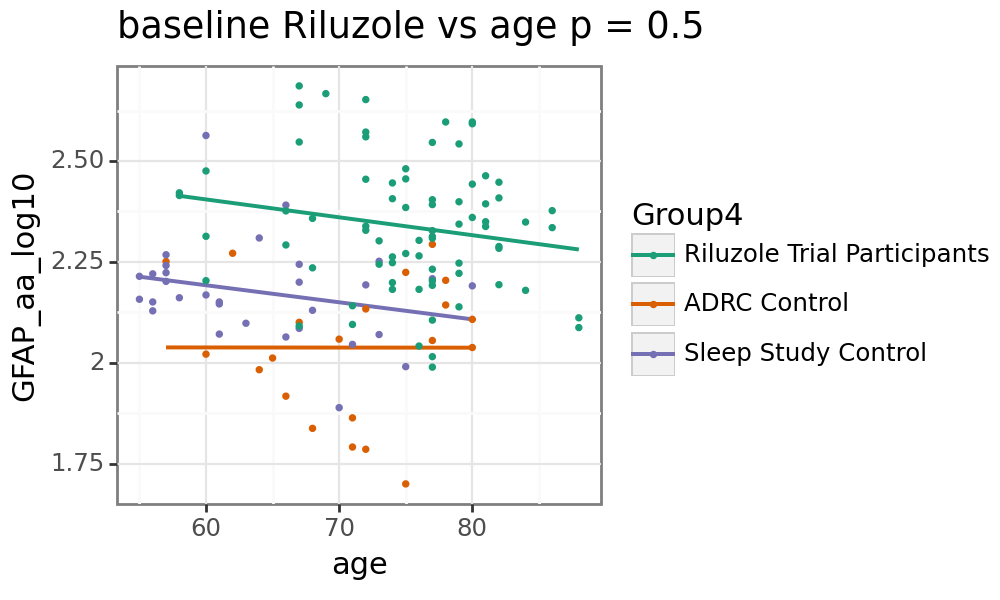

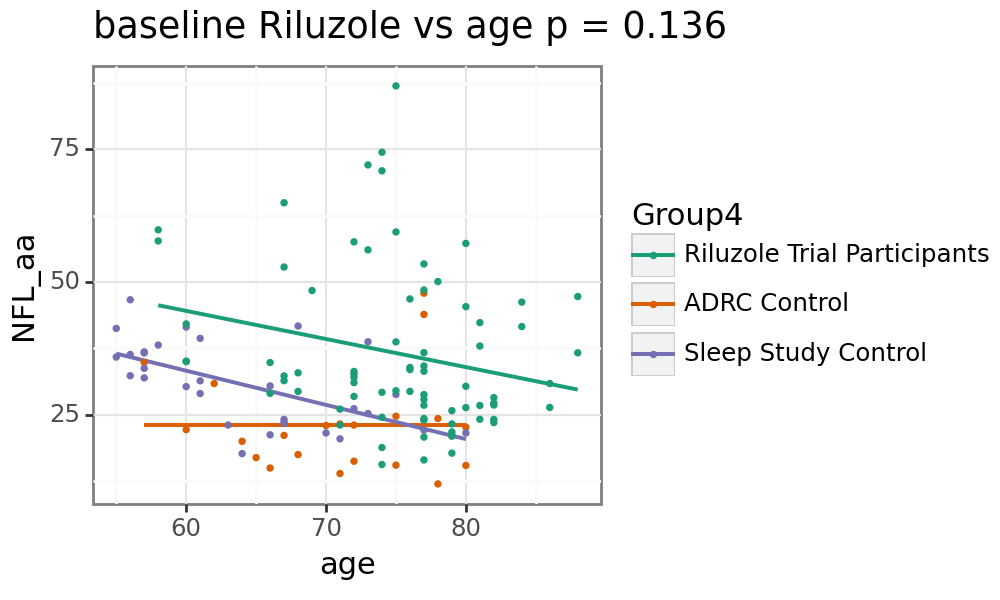

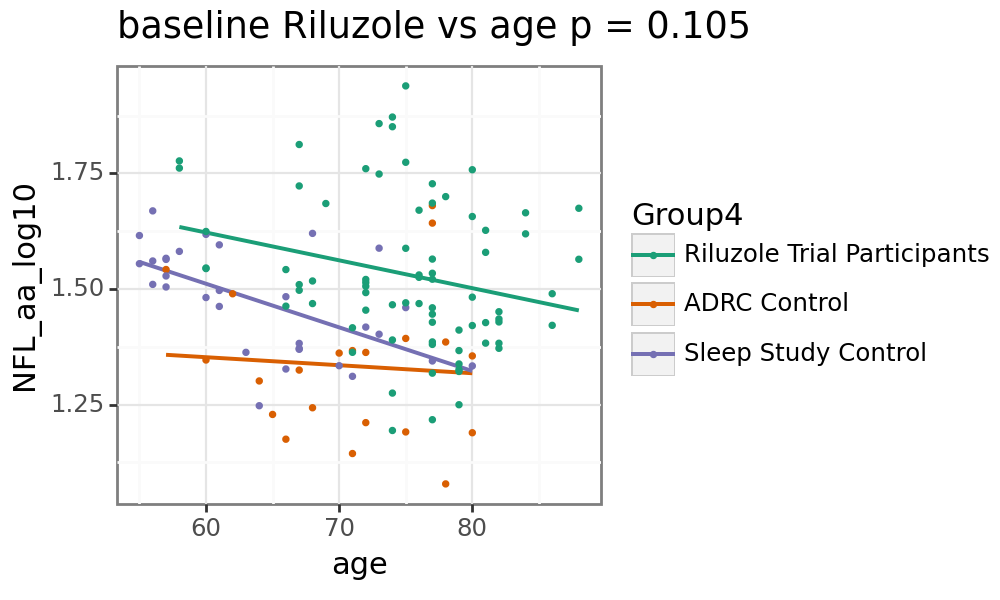

In [52]:
p9.options.figure_size = (5,3)
for var in plasma_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = baseline_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm', span = 1)
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)


    model = smf.ols(formula ='age ~ ' + var +'_log10', data = baseline_data).fit(disp = 0);
    pval = model.pvalues[var +'_log10'].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var +'_log10', color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm', span = 1)
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)


## Volumetric
significant for: ['VOL_Precun_Lz', 'VOL_Precun_Rz', 'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_ParaPostCentr_Rz', 'VOL_SupraMarg_Lz',
 'VOL_SupPar_Lz', 'VOL_SupPar_Rz', 'VOL_MidFront_Lz', 'VOL_PrecFront_Lz', 'VOL_PrecFront_Rz', 'VOL_TotalGrayz', 'VOL_TotalGray_Lz',
 'VOL_TotalGray_Rz', 'VOL_Parietal_Lz', 'VOL_Parietal_Rz', 'VOL_Frontal_Lz', 'VOL_MidSupFrontal_Lz', 'VOL_Precun_InfPar_Lz', 'VOL_Precun_InfPar_Rz',
 'VOL_Precun_InfPar_Supramarg_Lz', 'VOL_Precun_InfPar_Supramarg_Rz', 'VOL_InfParSupra_Lz', 'VOL_InfParSupra_Rz']

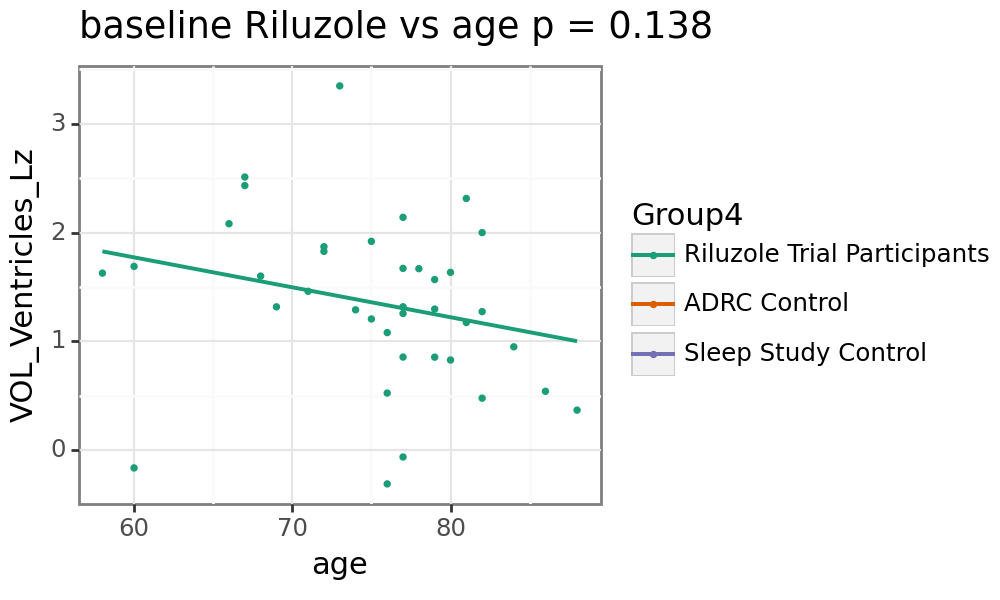

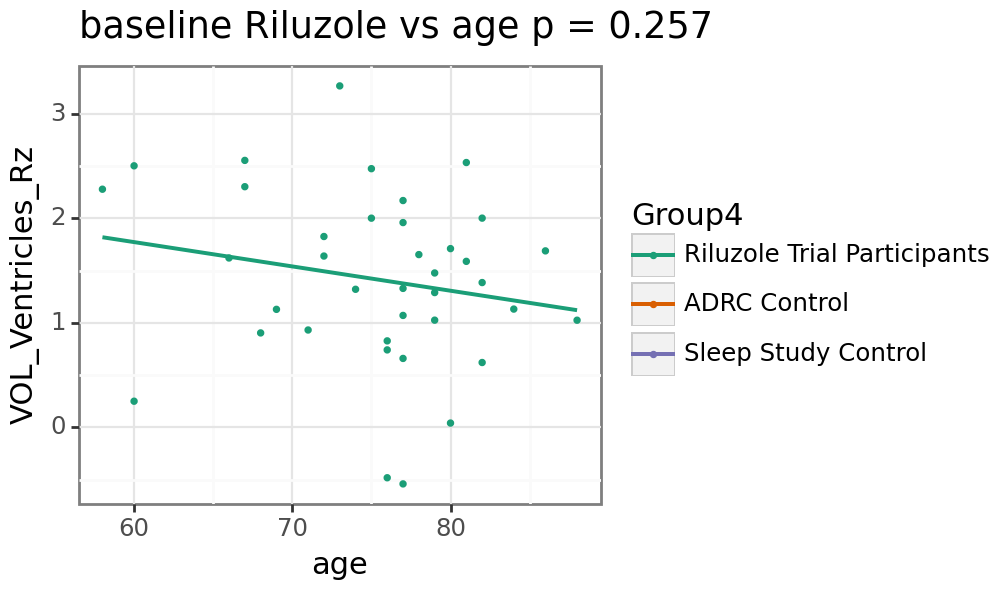

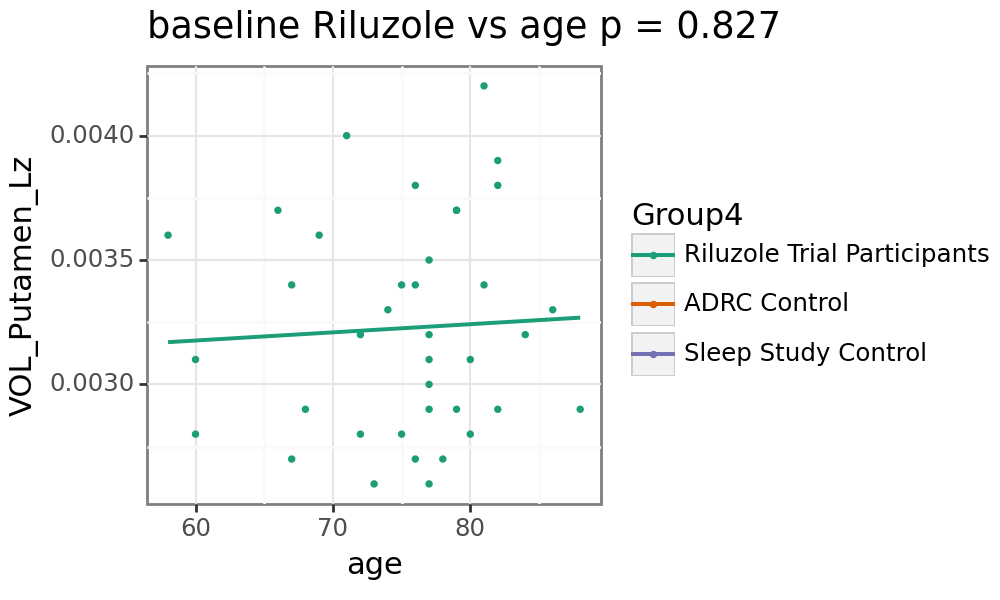

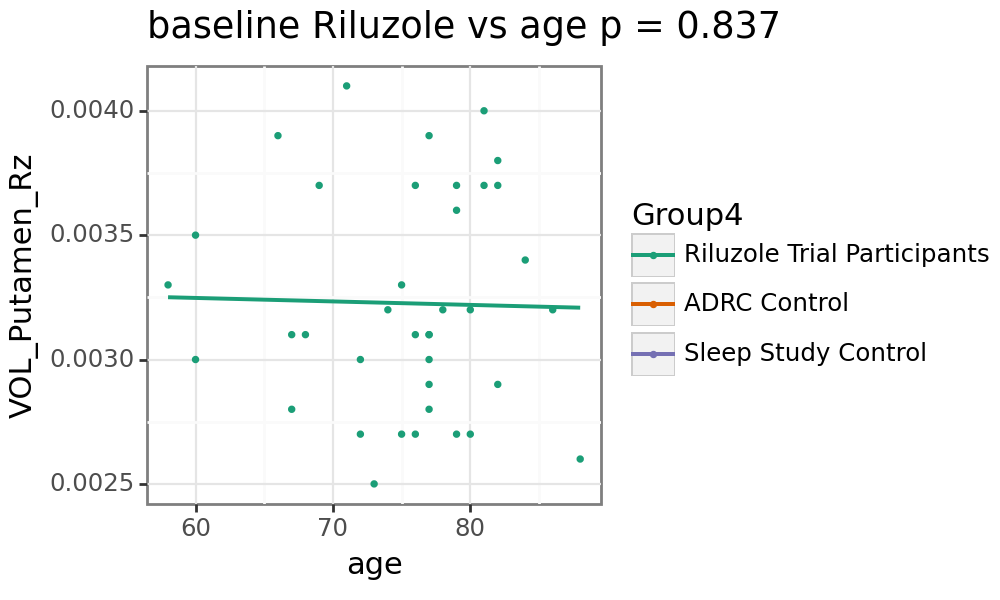

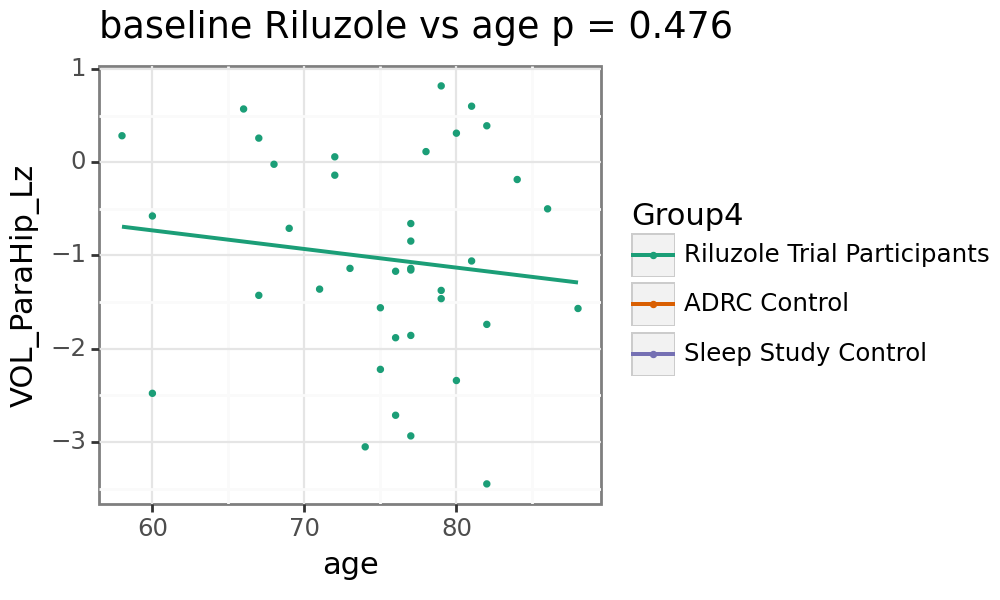

...

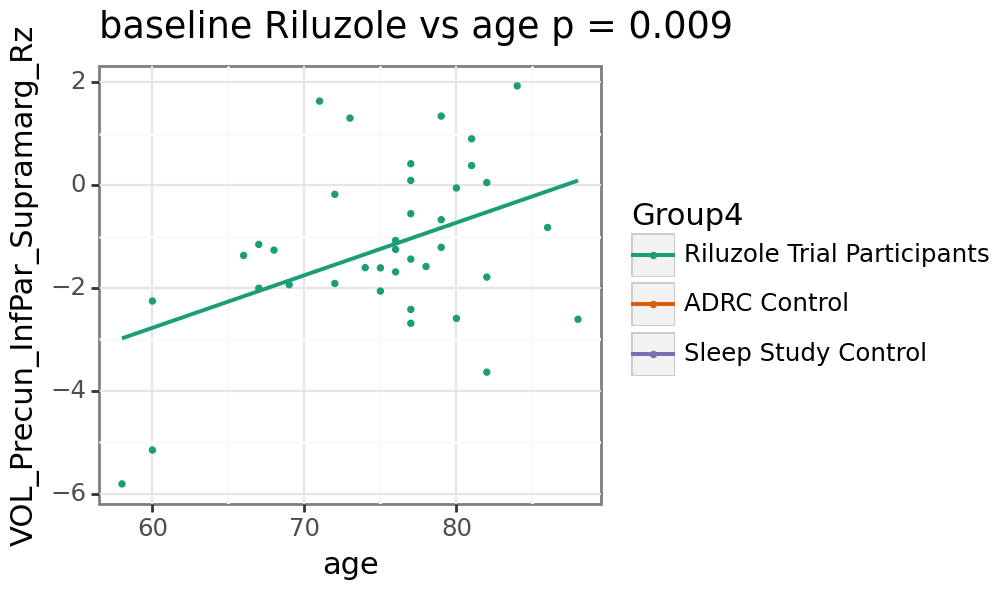

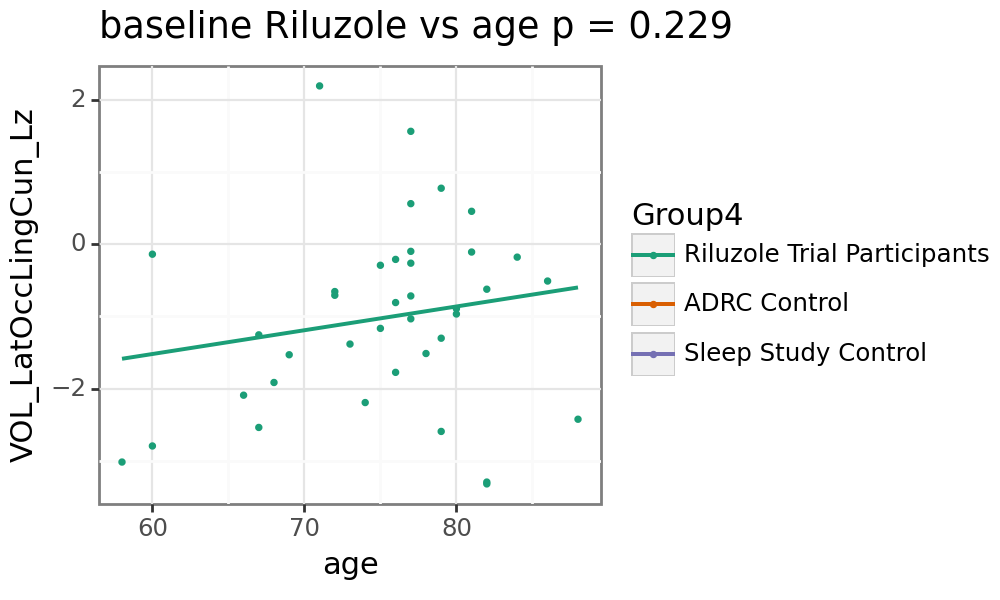

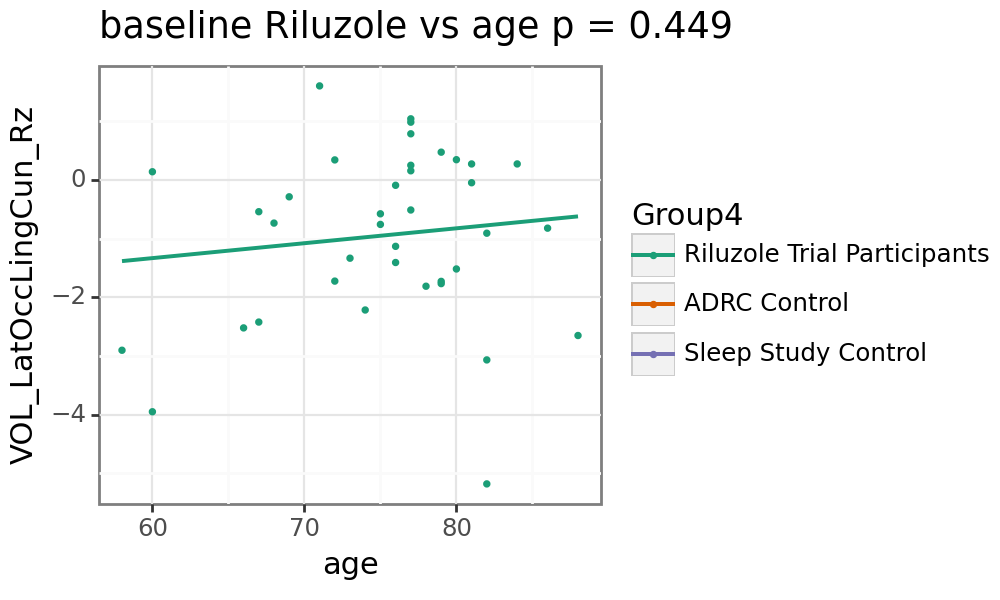

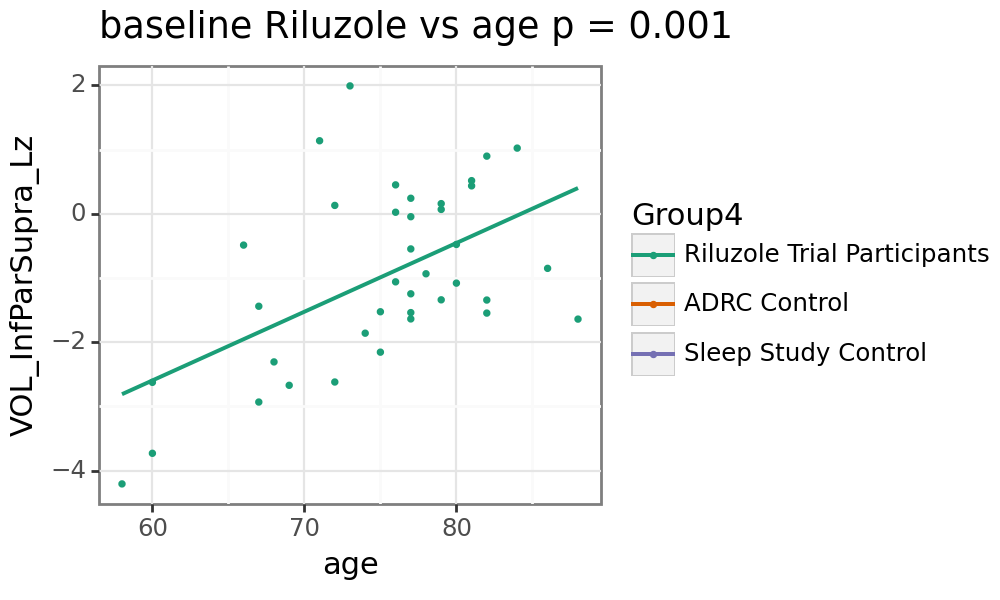

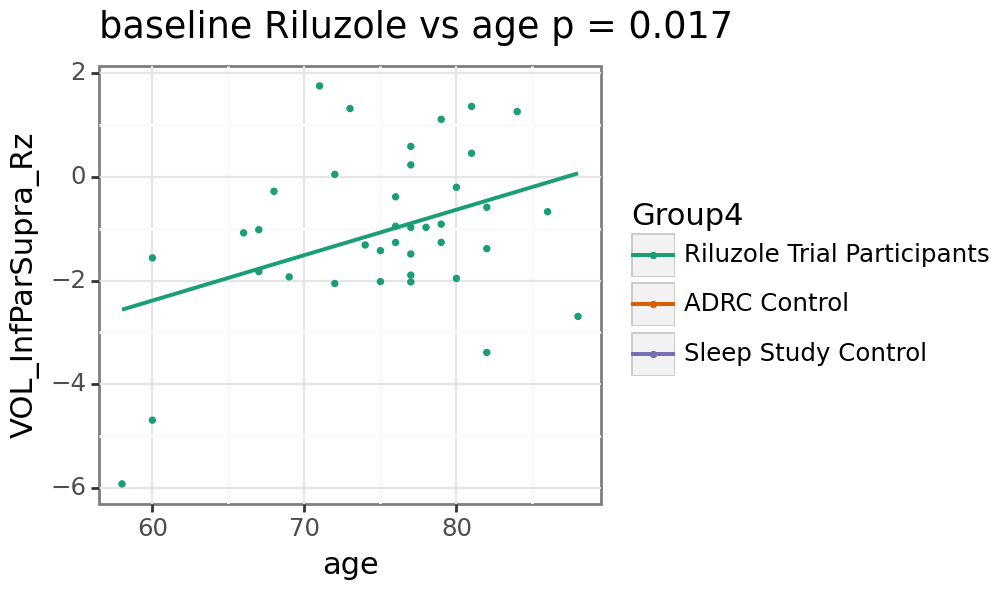

In [53]:
p9.options.figure_size = (5,3)
for var in vol_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = baseline_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)


## Cognitive
significant for tma

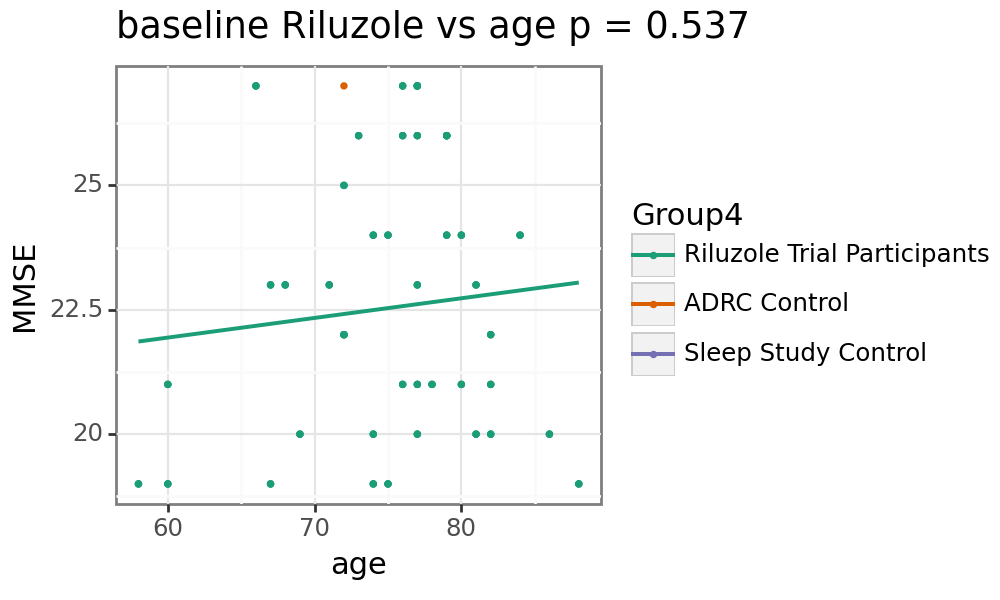

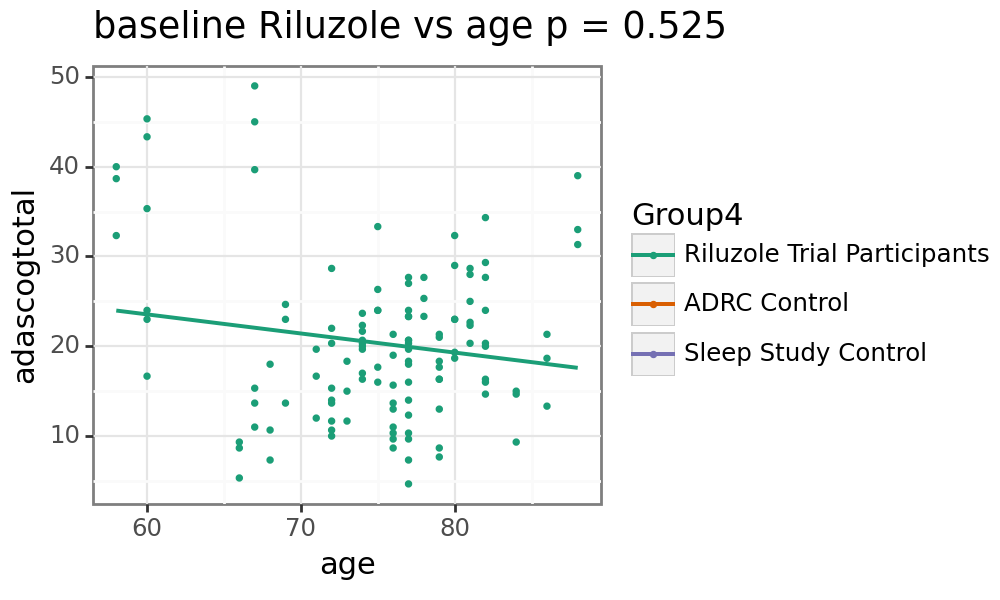

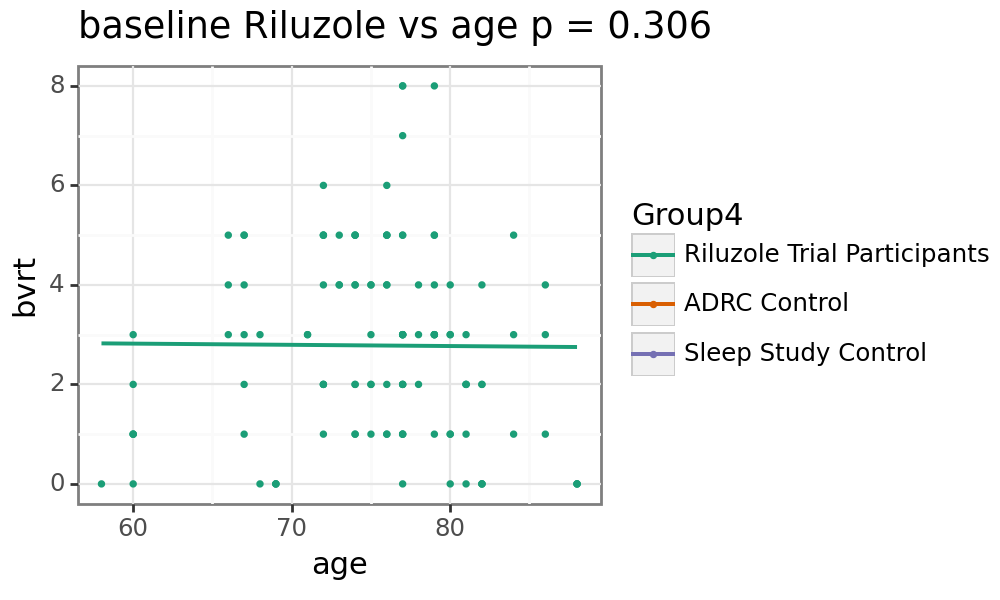

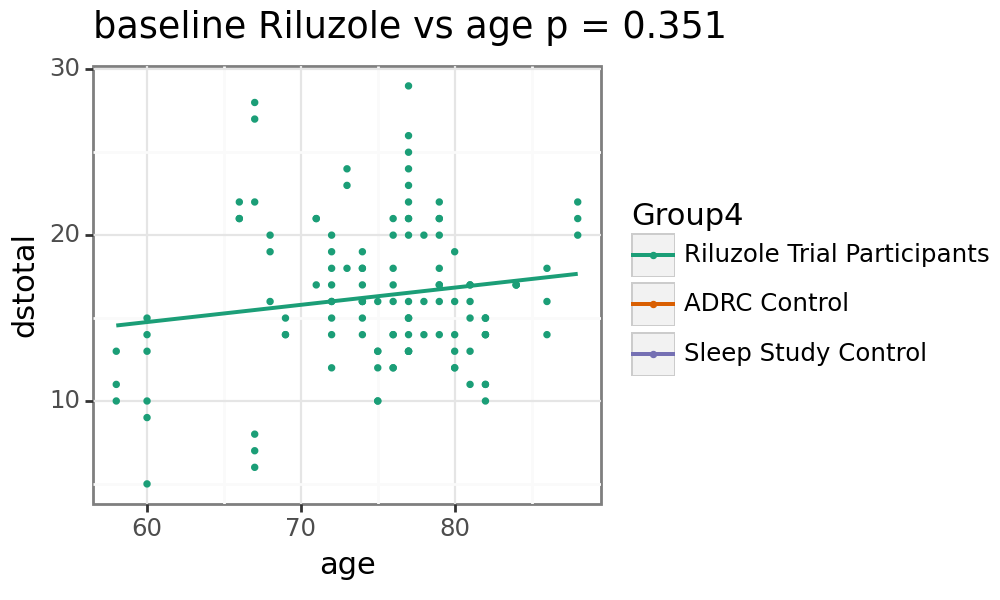

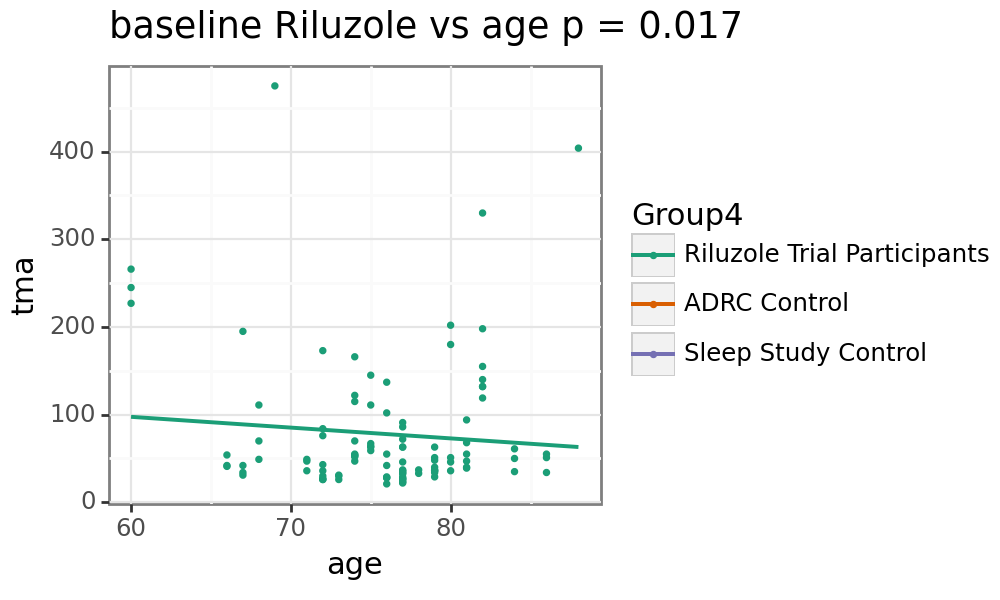

...

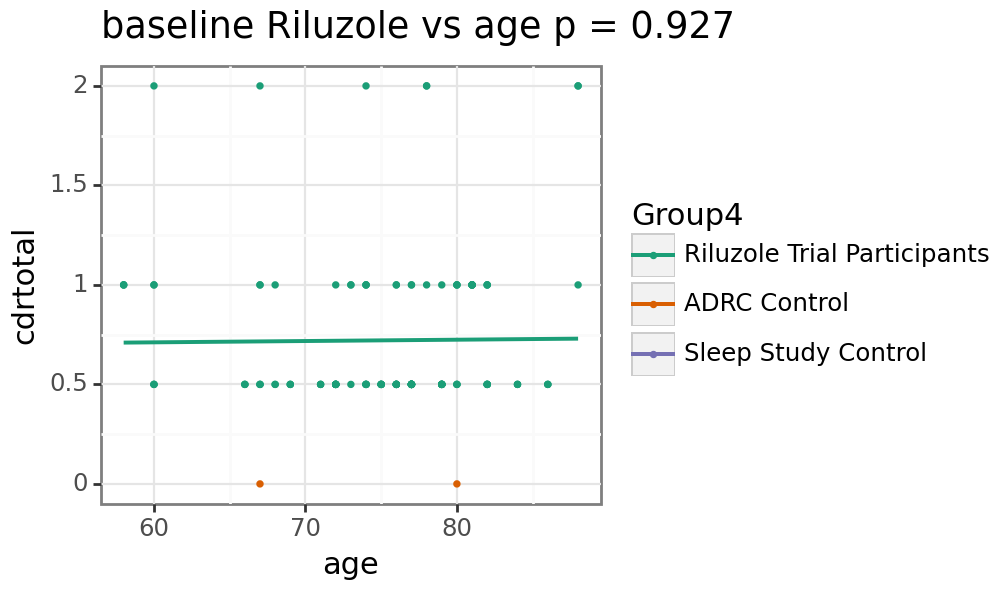

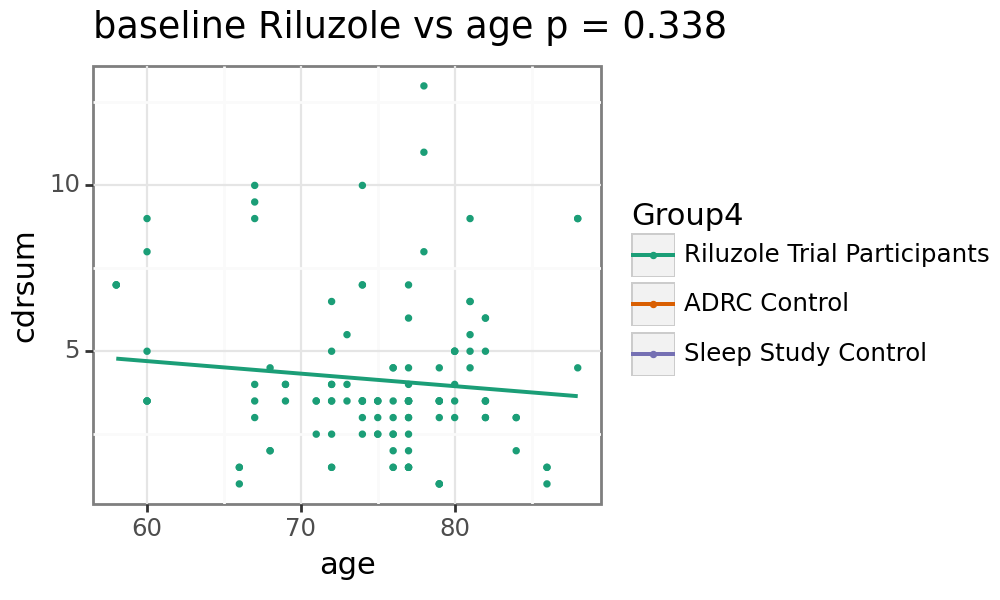

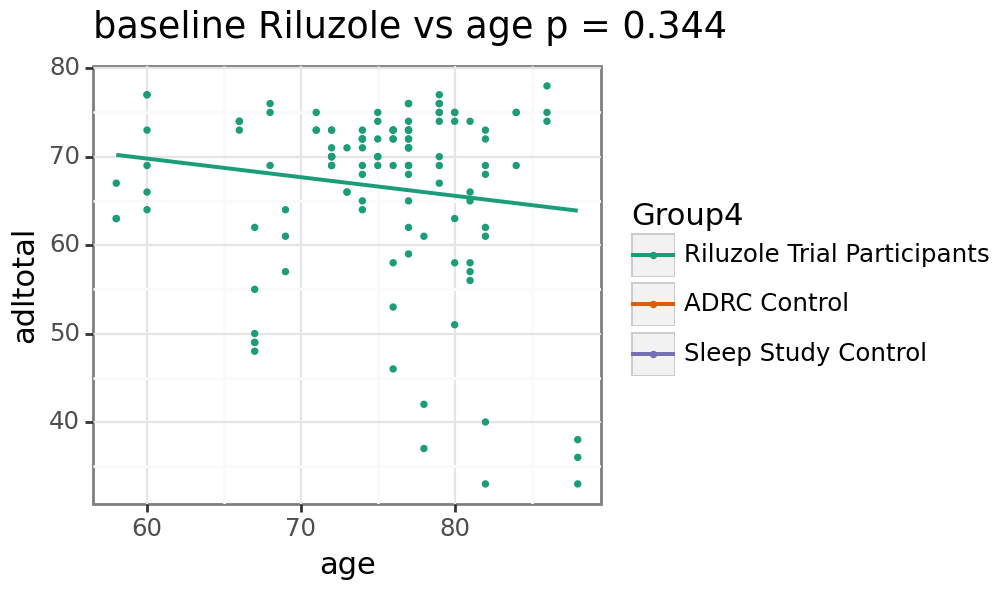

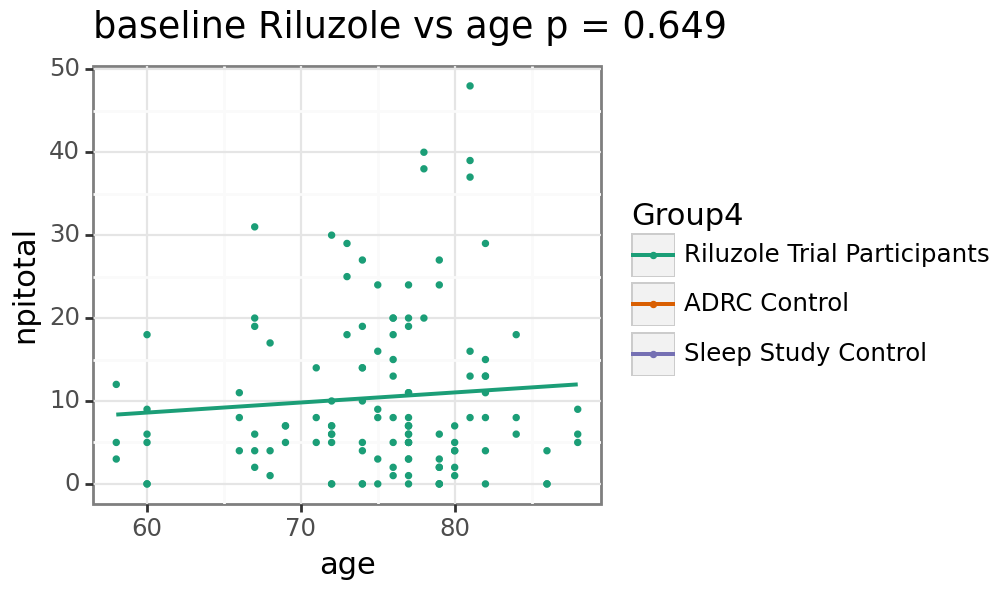

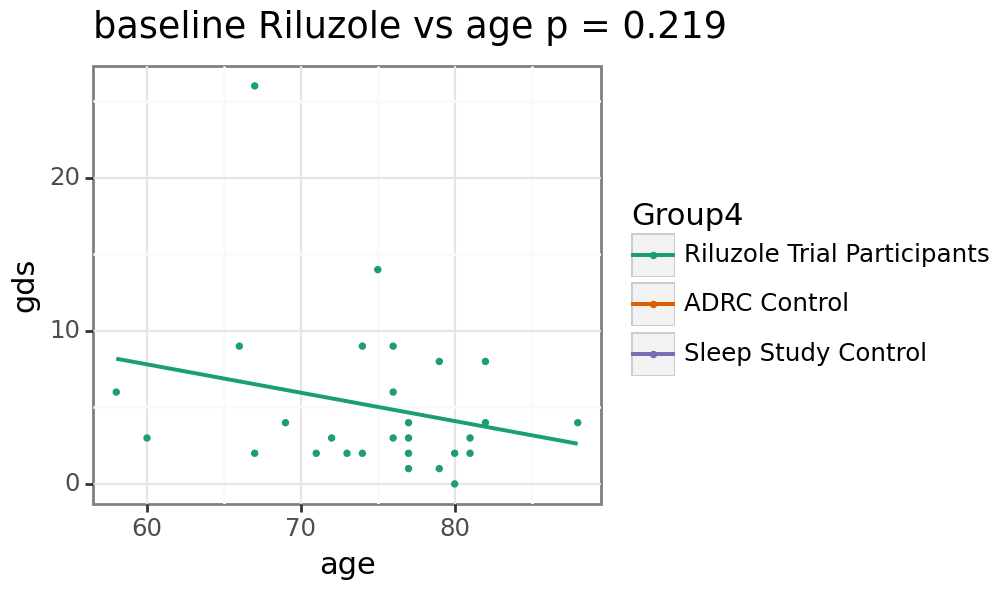

In [54]:
for var in cog_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = baseline_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)

## FDG - new para rr
significant for 'Avg_Hip', 'MTL_gm', 'L_Hip', 'Par_gm'

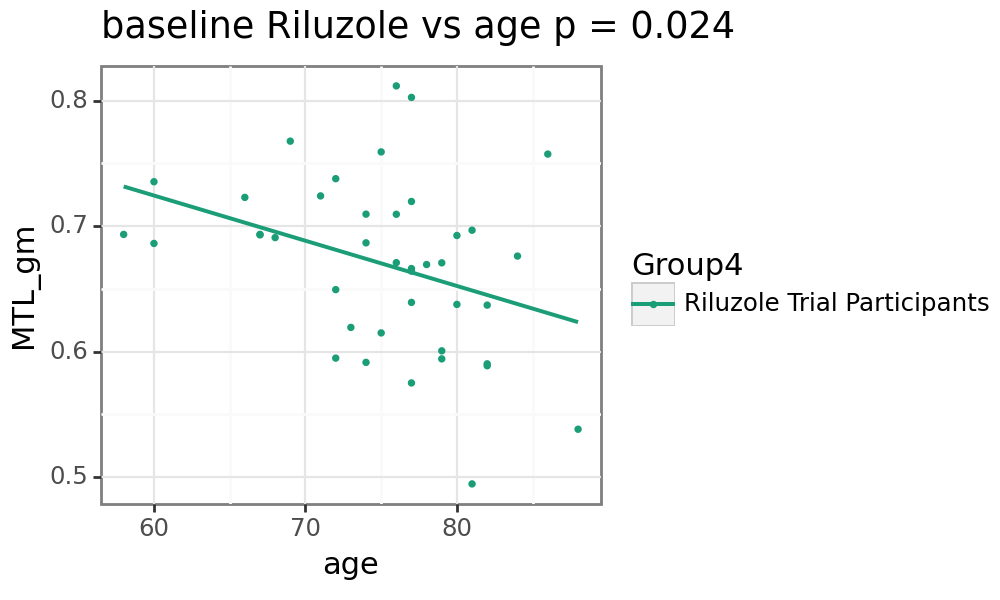

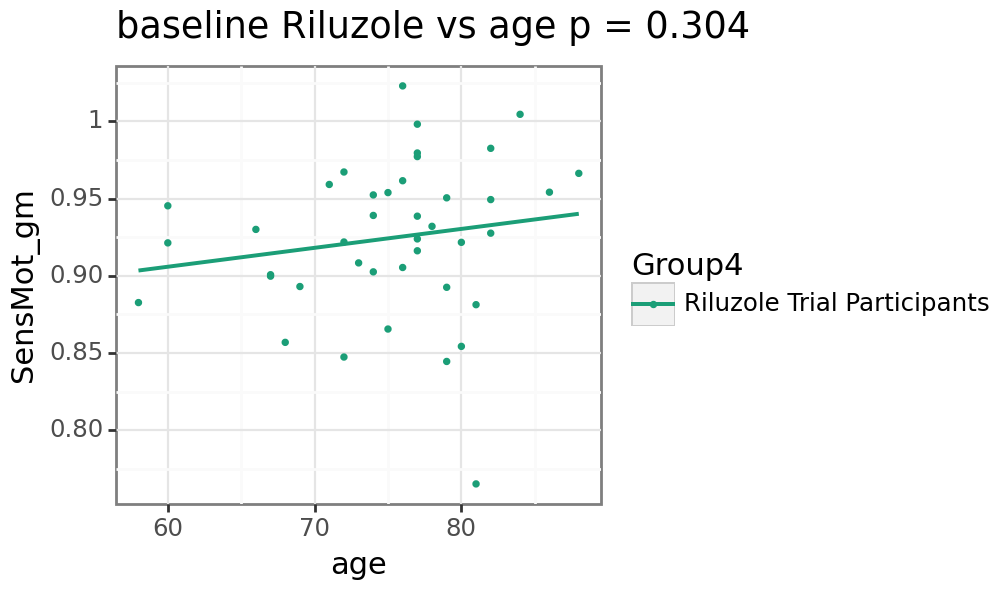

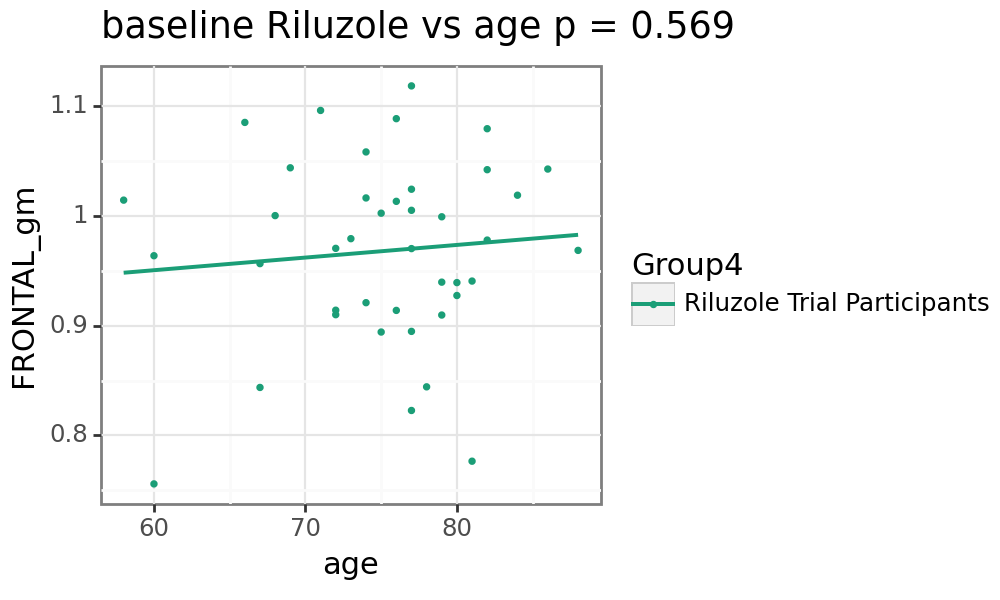

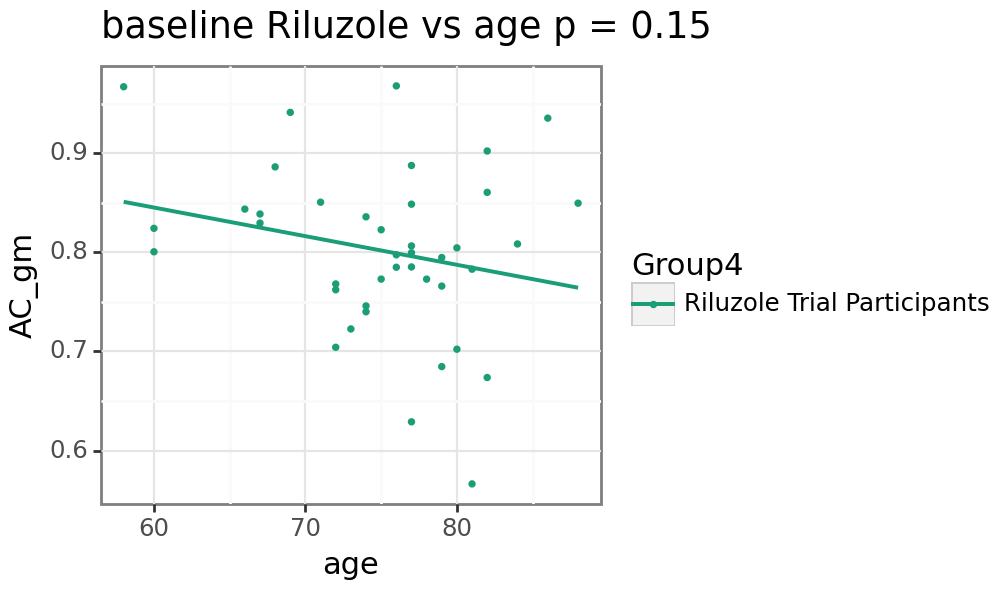

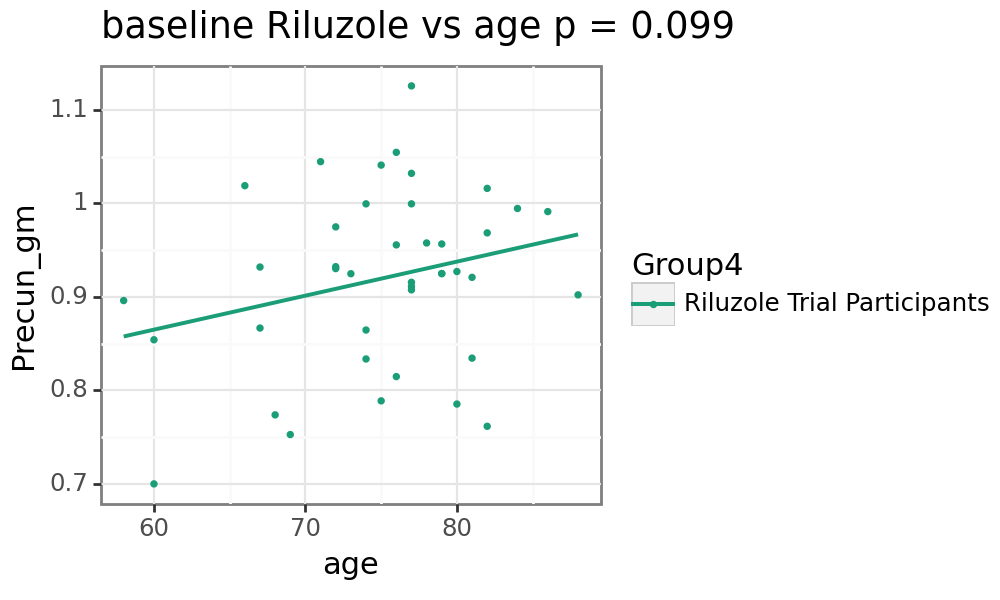

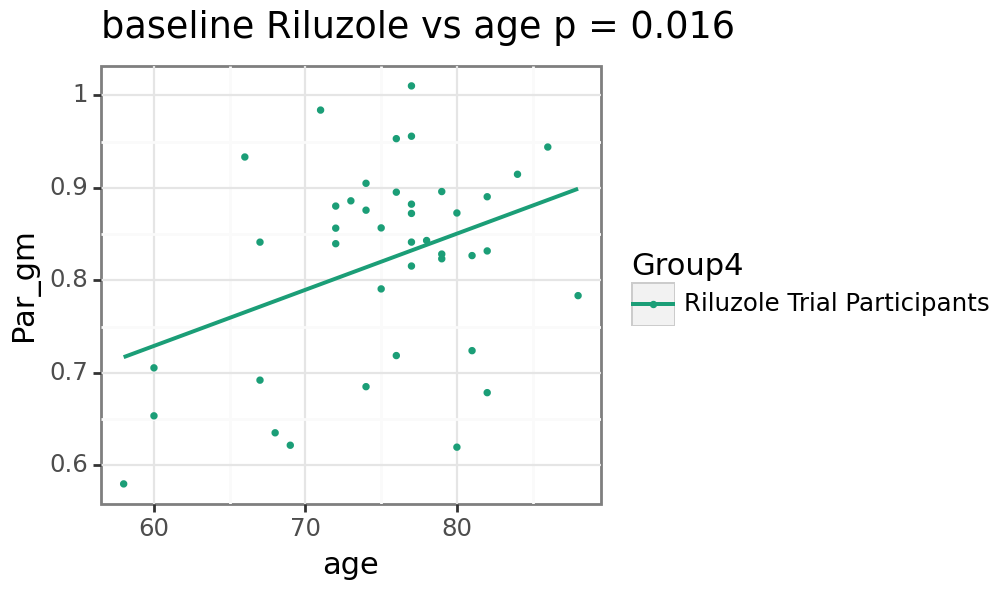

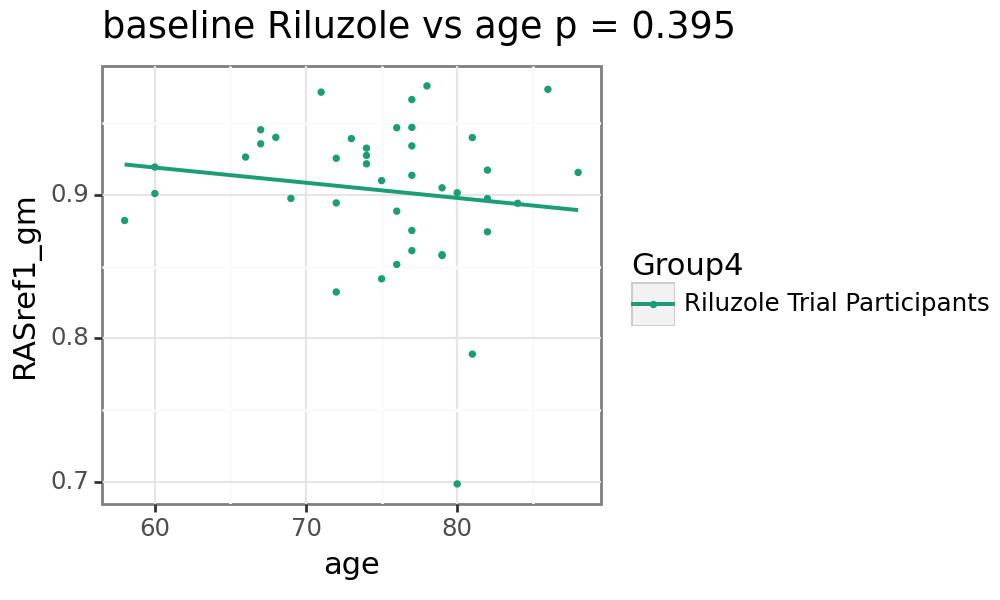

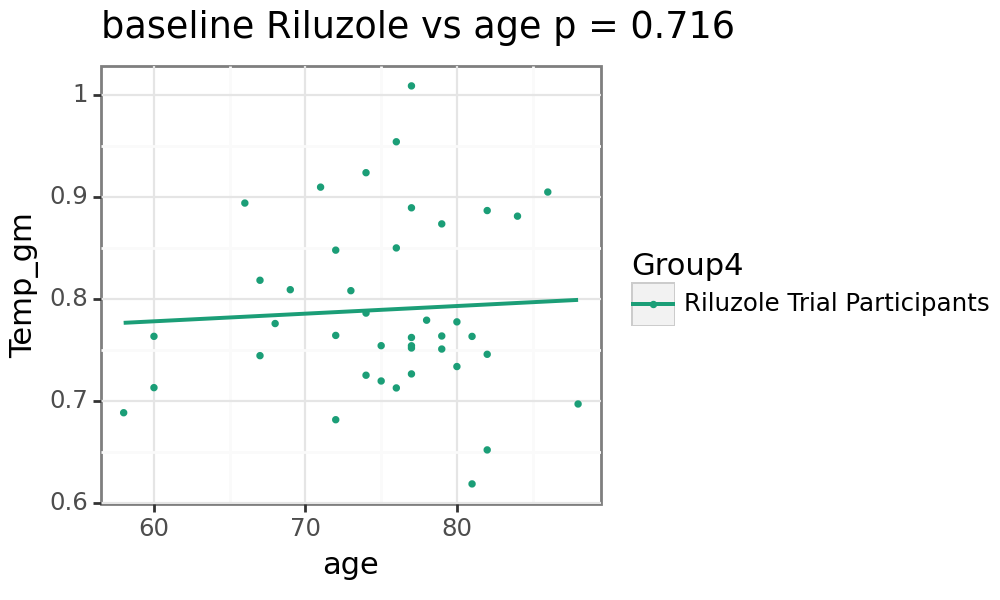

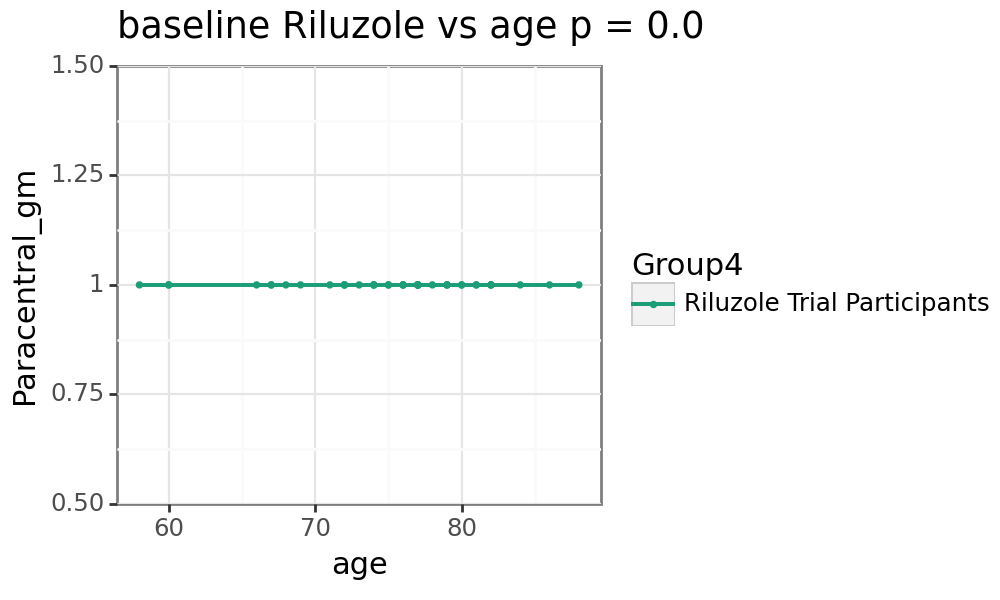

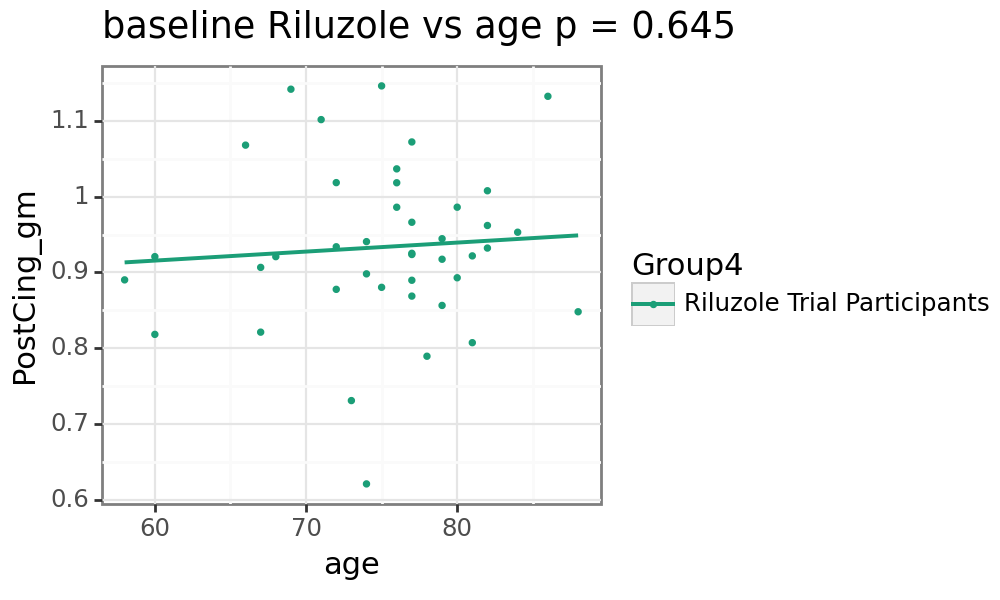

In [55]:
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_para_new_merge.columns]:
    subset_data = data_FDG_rr_para_new_merge.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data = subset_data[subset_data['Group2'].isin(['Riluzole Trial Participants']) & subset_data['timepoint'].isin(['base'])]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)


    model = smf.ols(formula ='age ~ ' + var, data = subset_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)

## FDG - composite rr

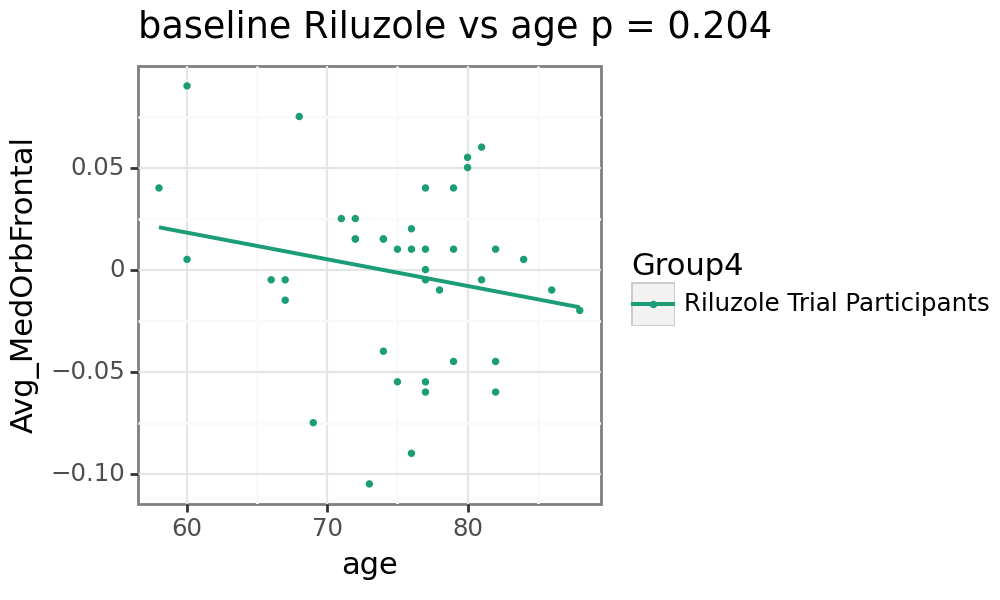

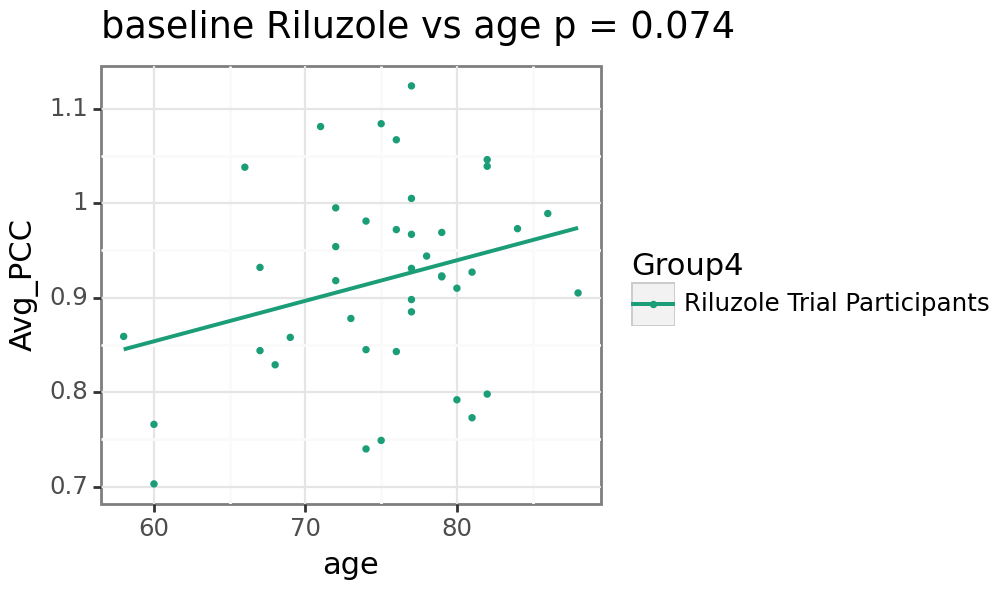

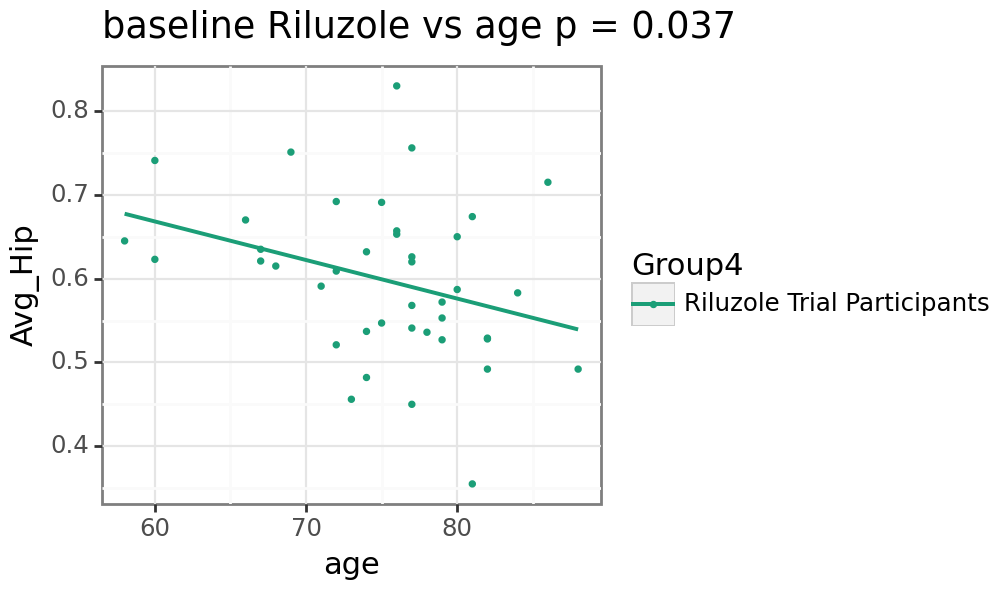

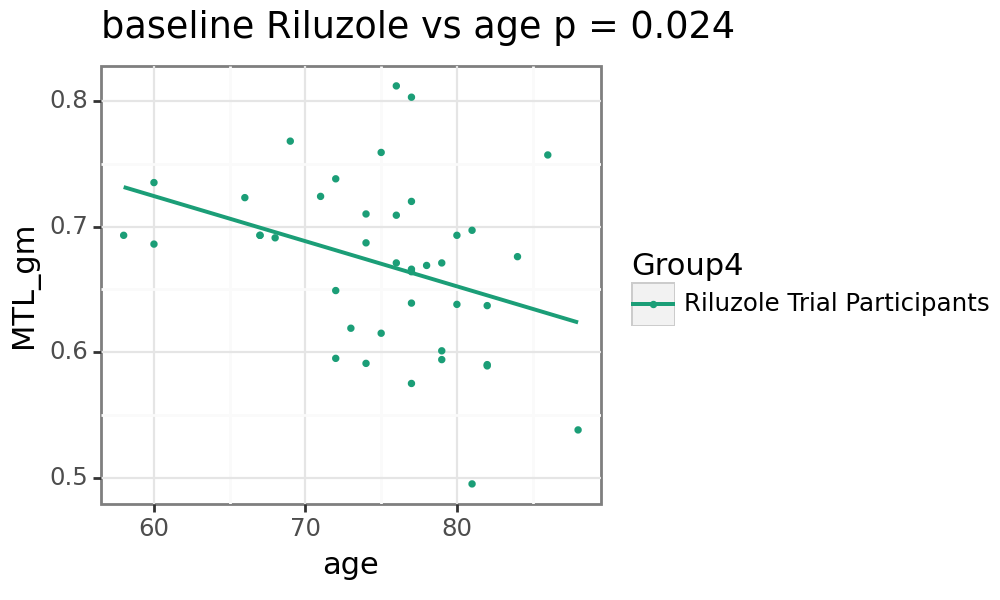

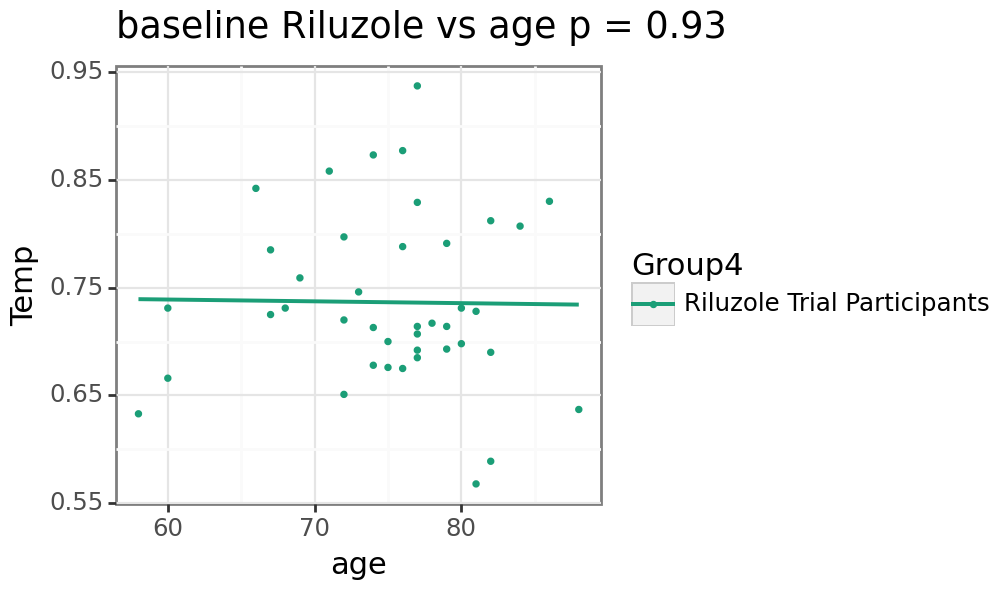

...

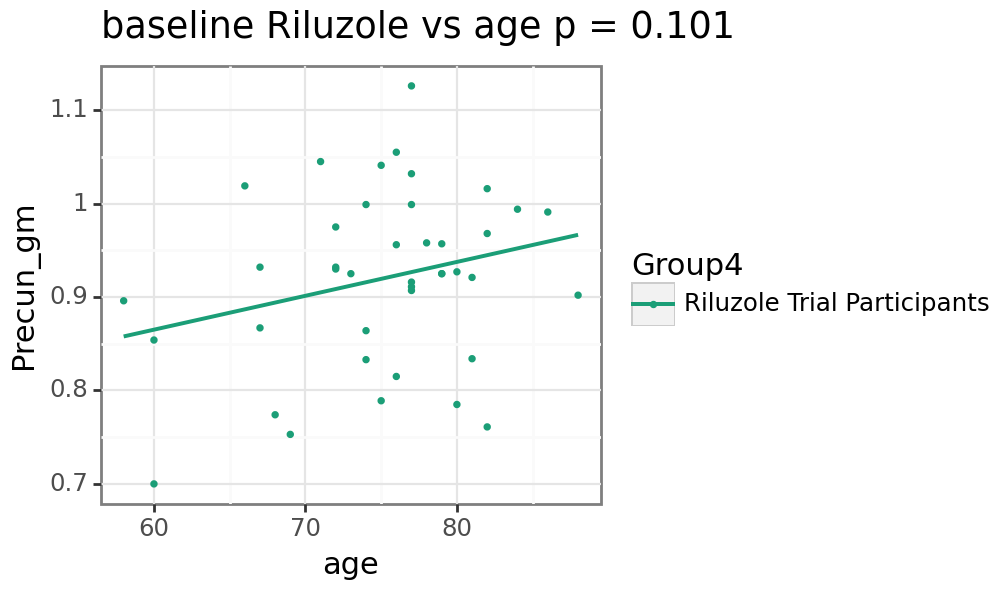

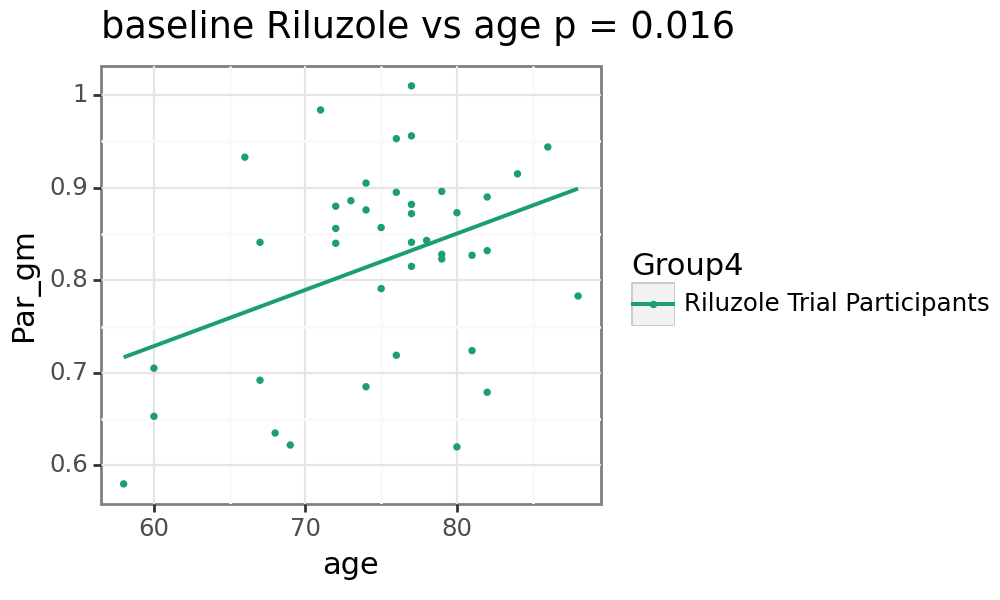

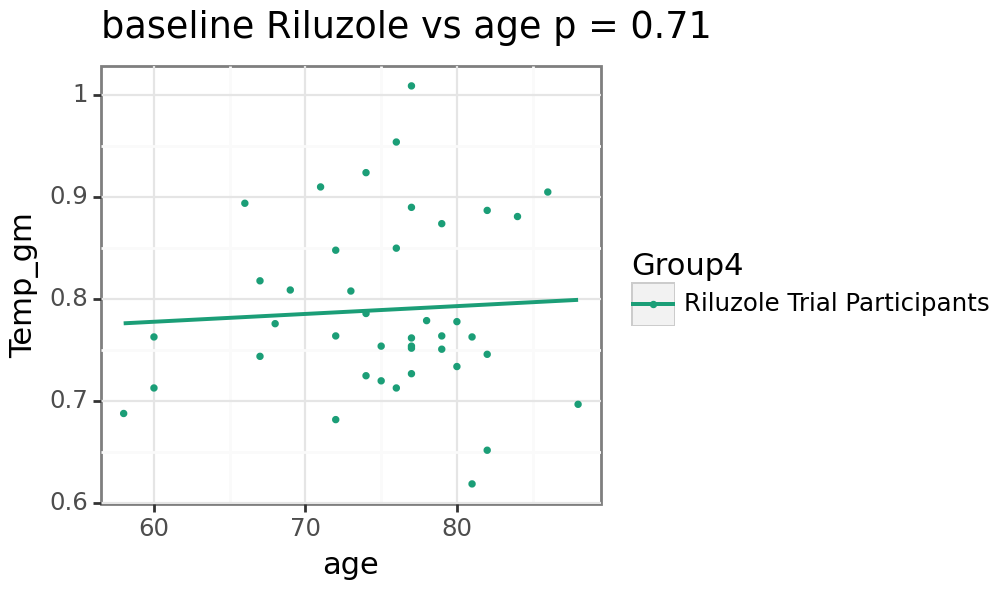

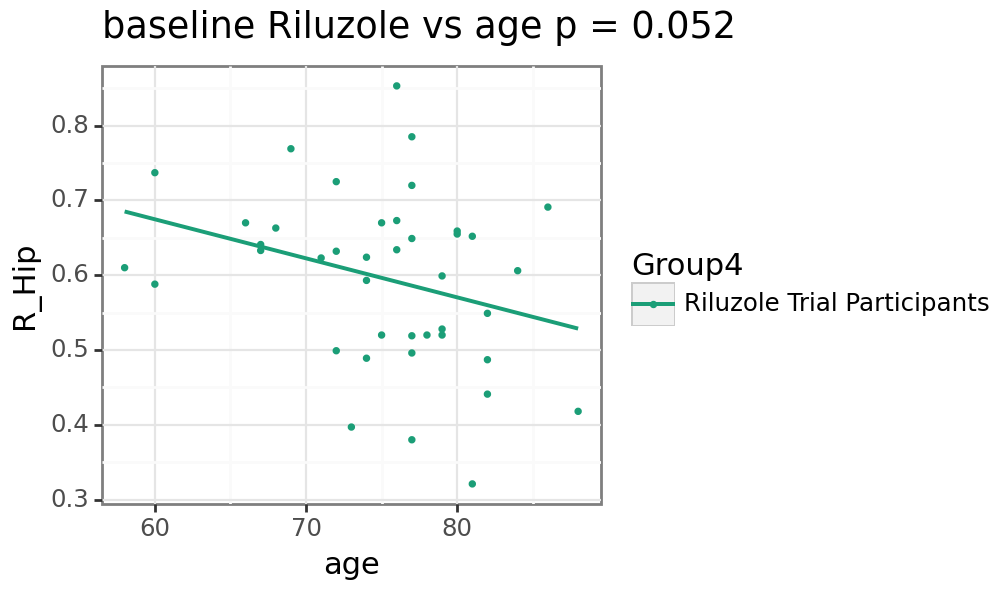

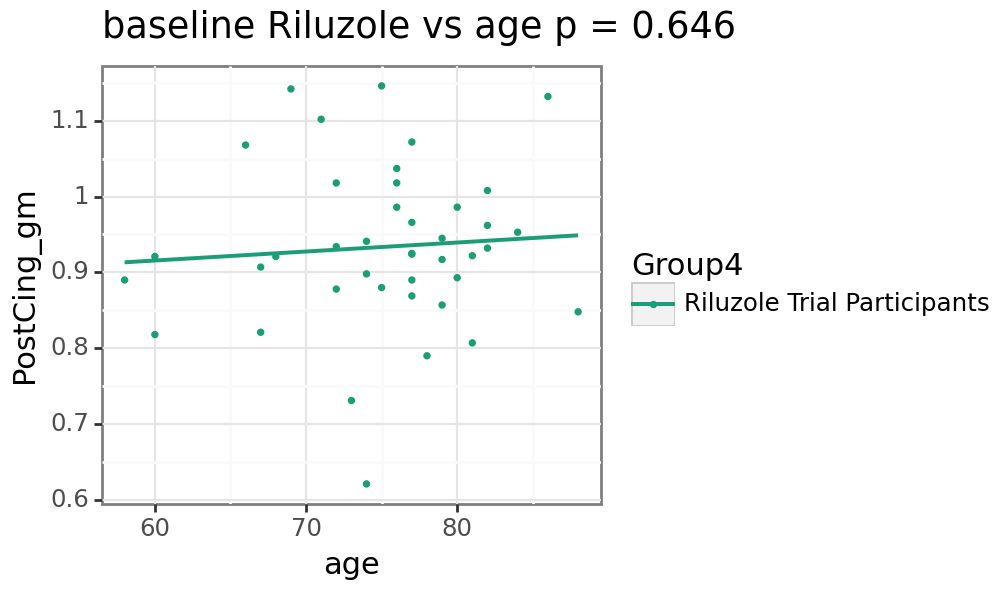

In [56]:
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_orig_merge.columns]:
    subset_data = data_FDG_rr_orig_merge.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data = subset_data[subset_data['Group2'].isin(['Riluzole Trial Participants']) & subset_data['timepoint'].isin(['base'])]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = subset_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)

## FDG - pons rr

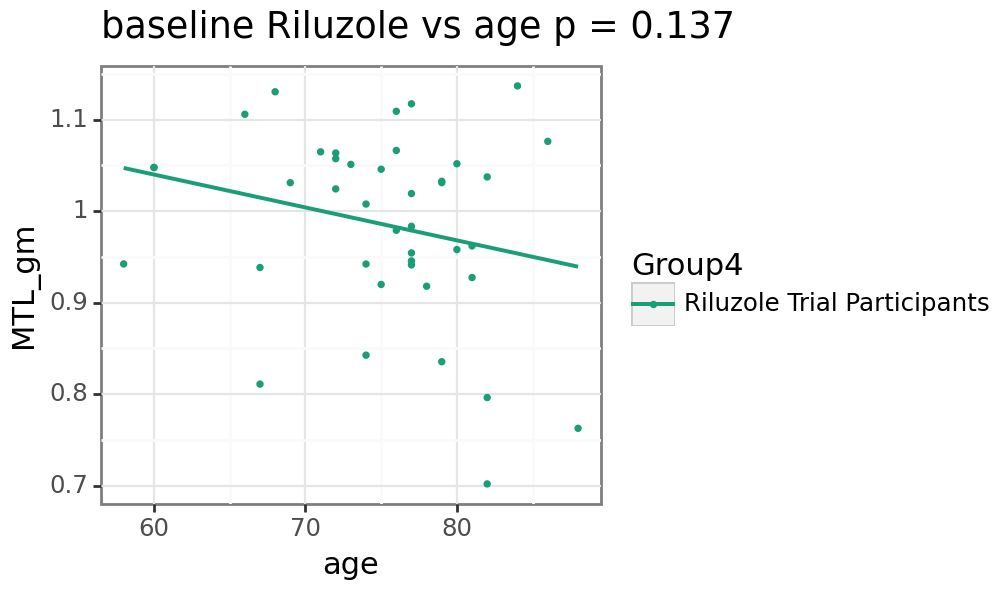

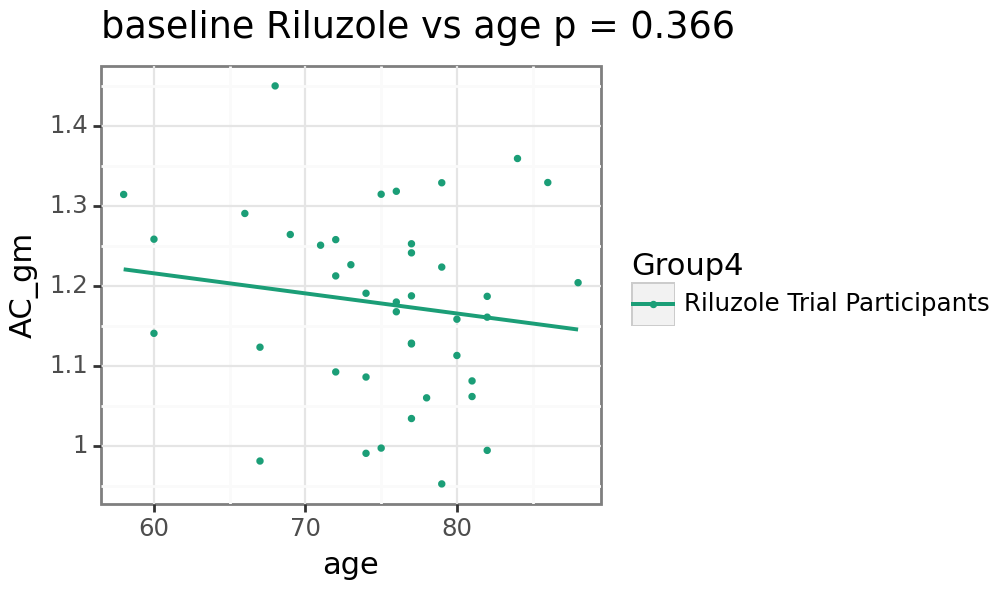

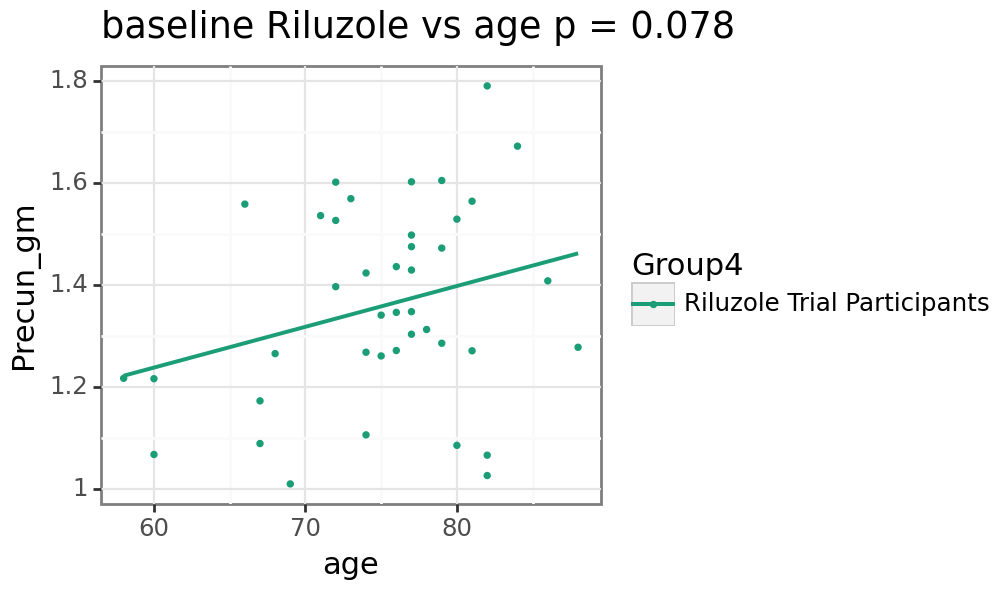

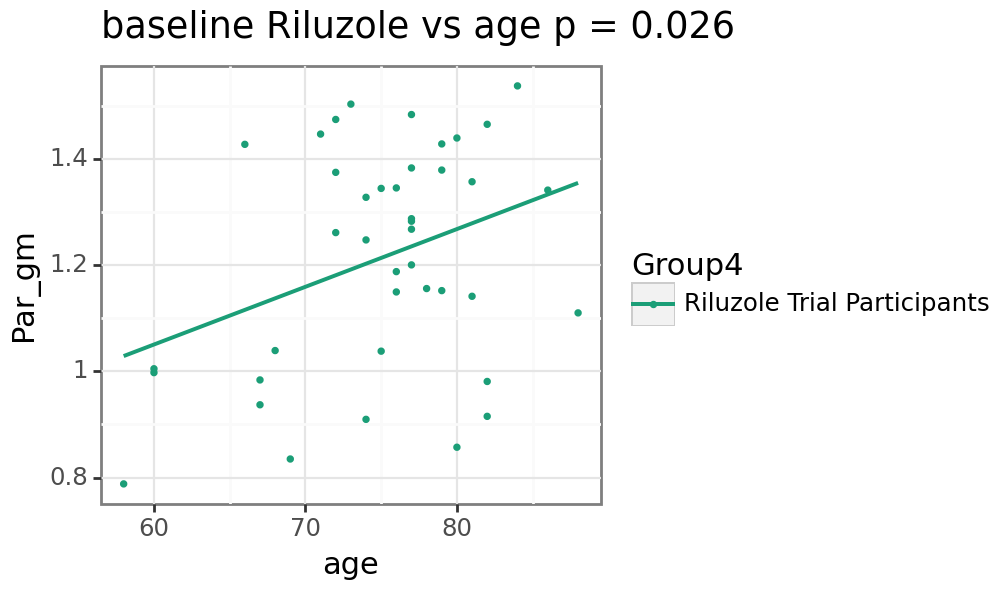

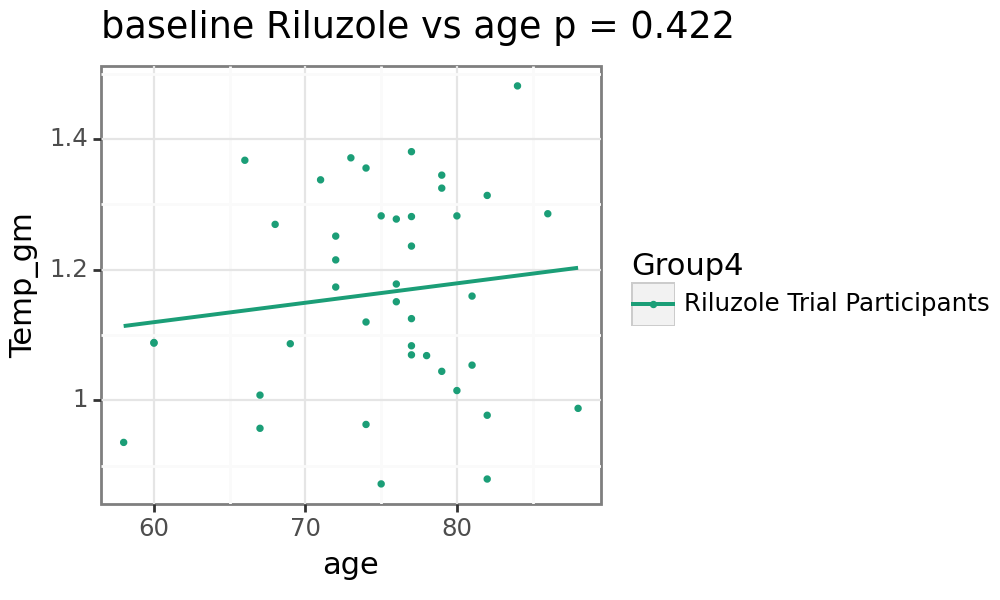

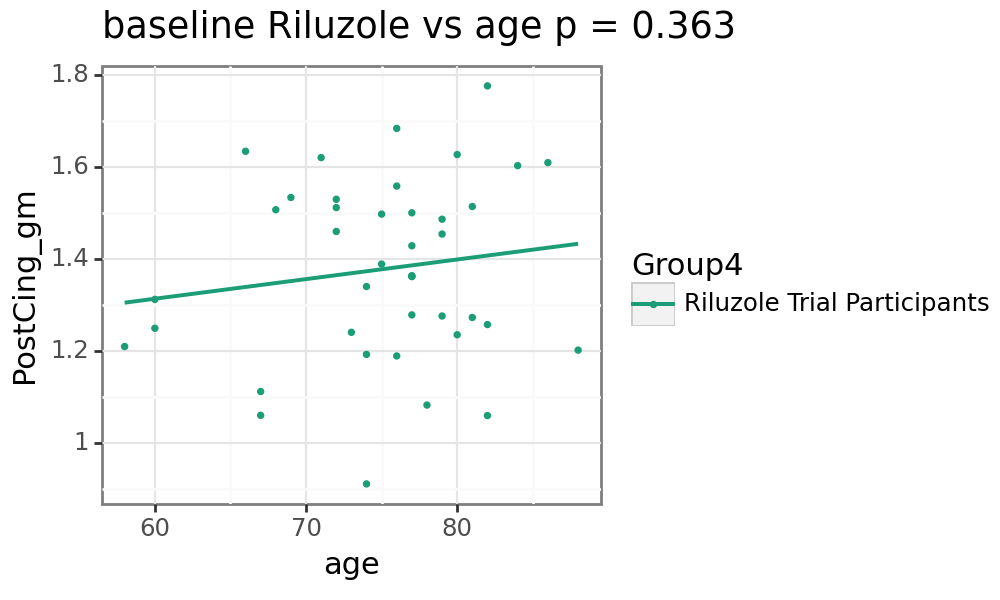

In [57]:
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_pons_merge.columns]:
    subset_data = data_FDG_rr_pons_merge.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data = subset_data[subset_data['Group2'].isin(['Riluzole Trial Participants']) & subset_data['timepoint'].isin(['base'])]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = subset_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)

## FDG - para2 rr

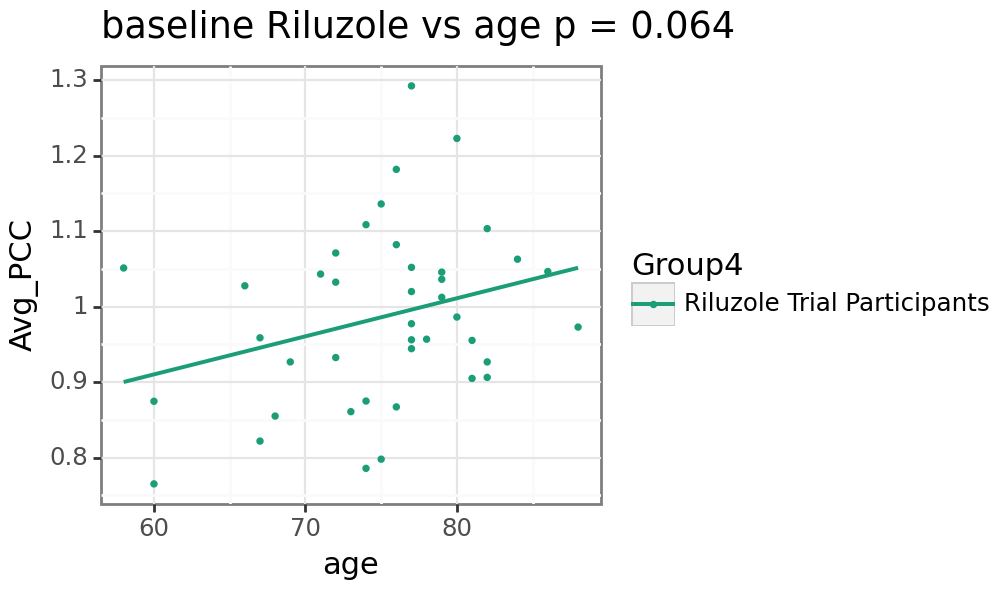

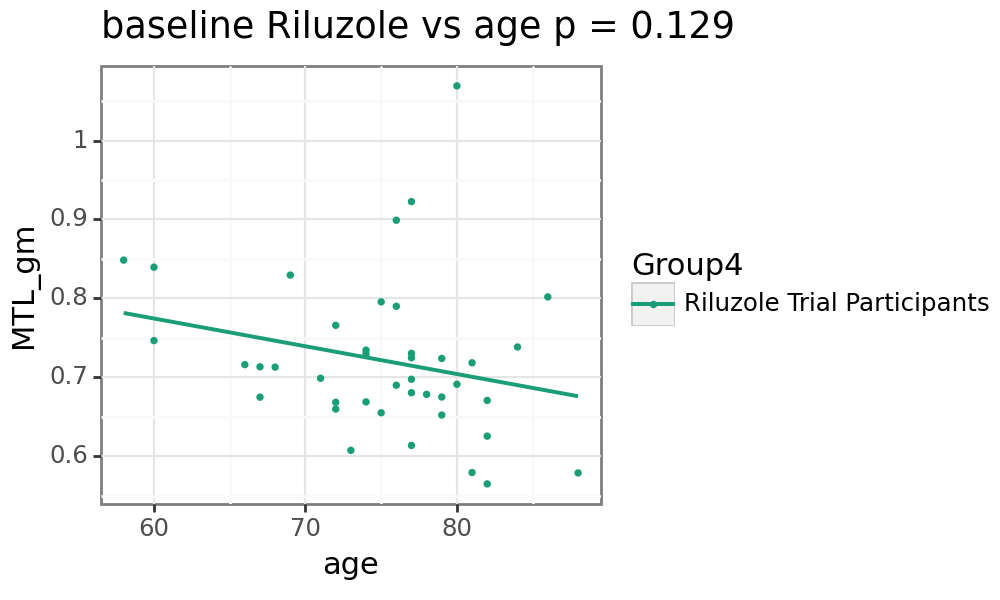

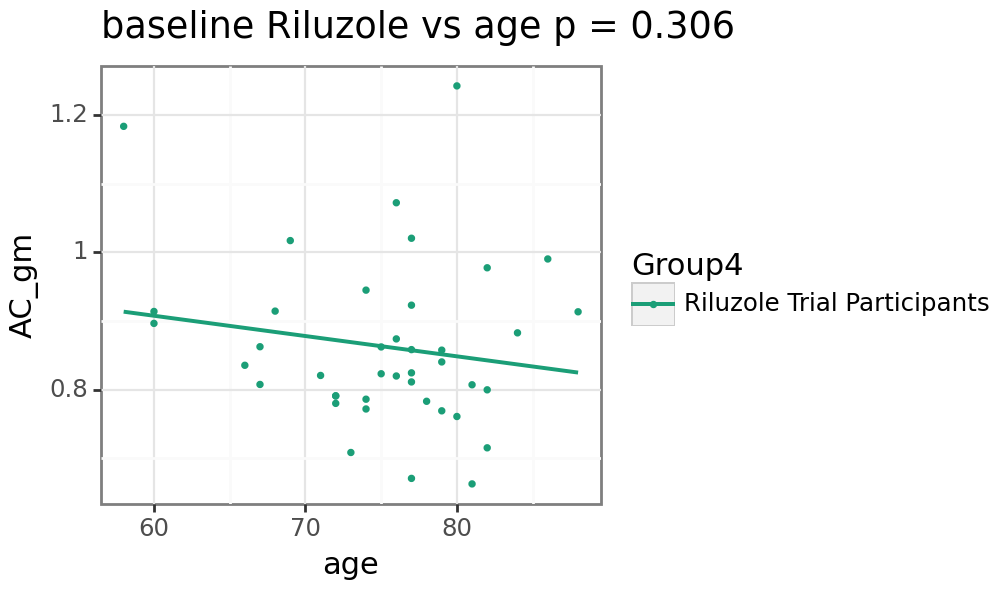

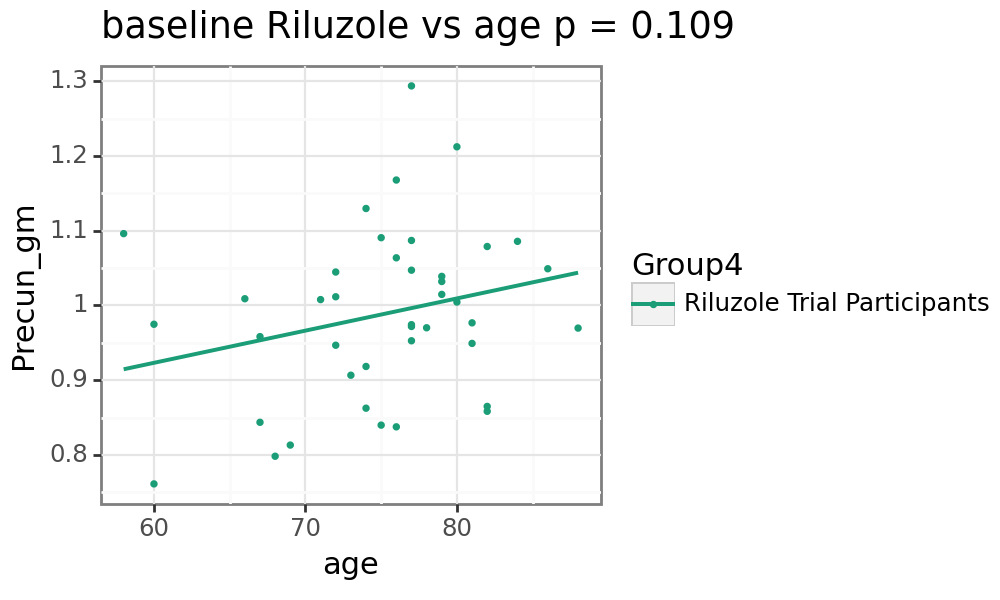

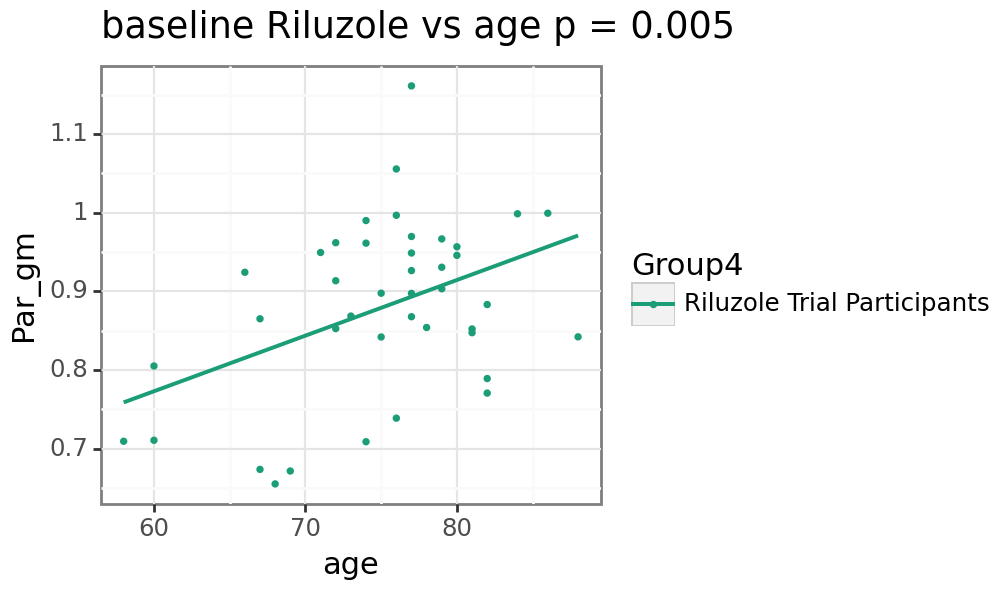

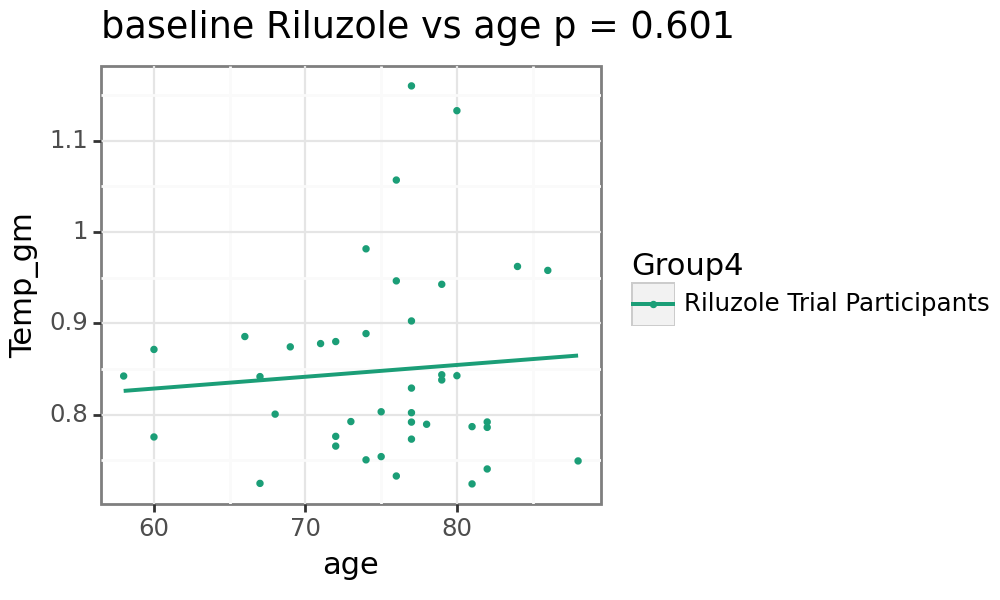

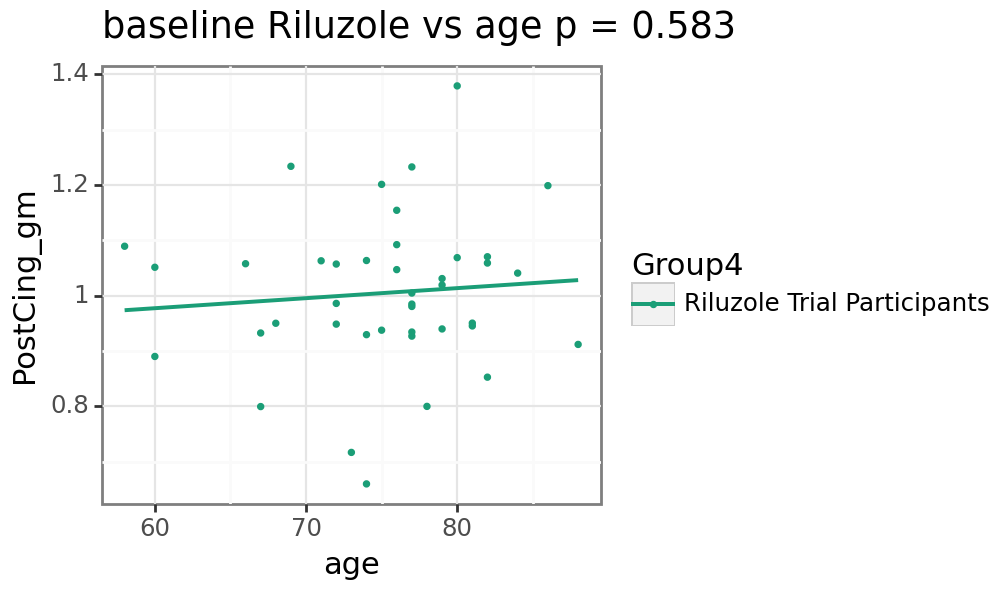

In [58]:
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_para_merge.columns]:
    subset_data = data_FDG_rr_para_merge.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data = subset_data[subset_data['Group2'].isin(['Riluzole Trial Participants']) & subset_data['timepoint'].isin(['base'])]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = subset_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)

## FDG - ras rr

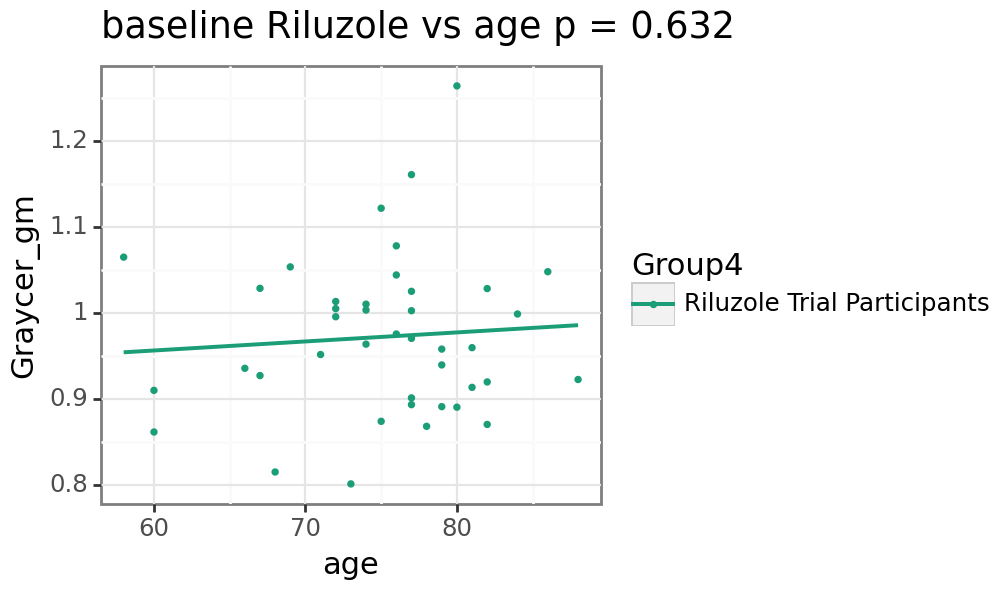

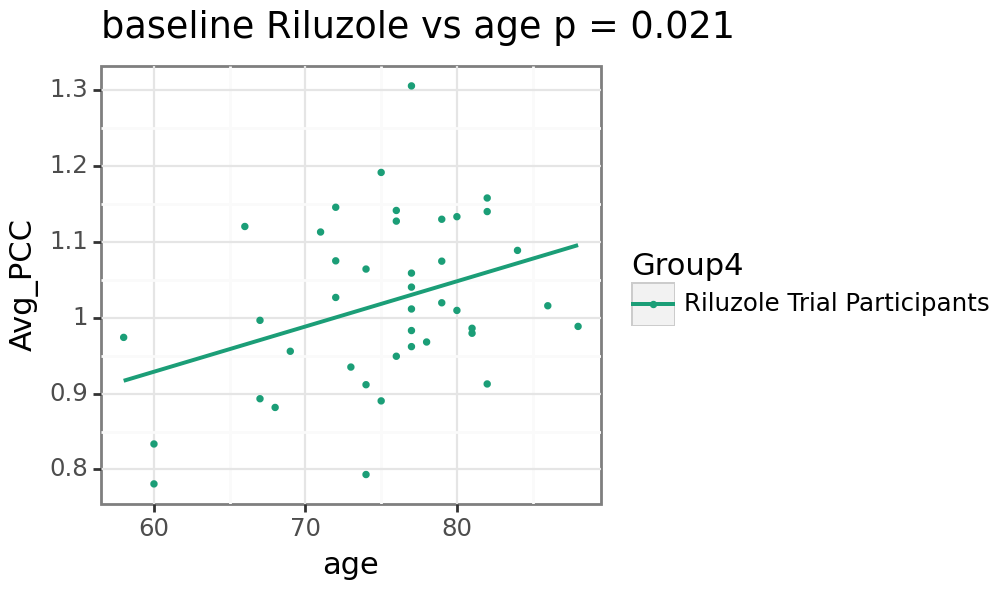

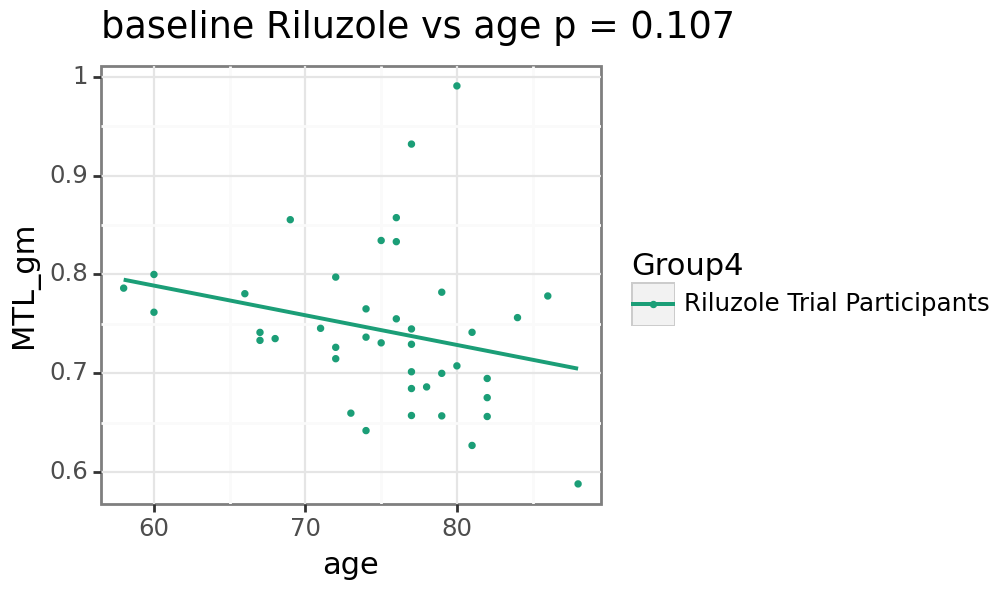

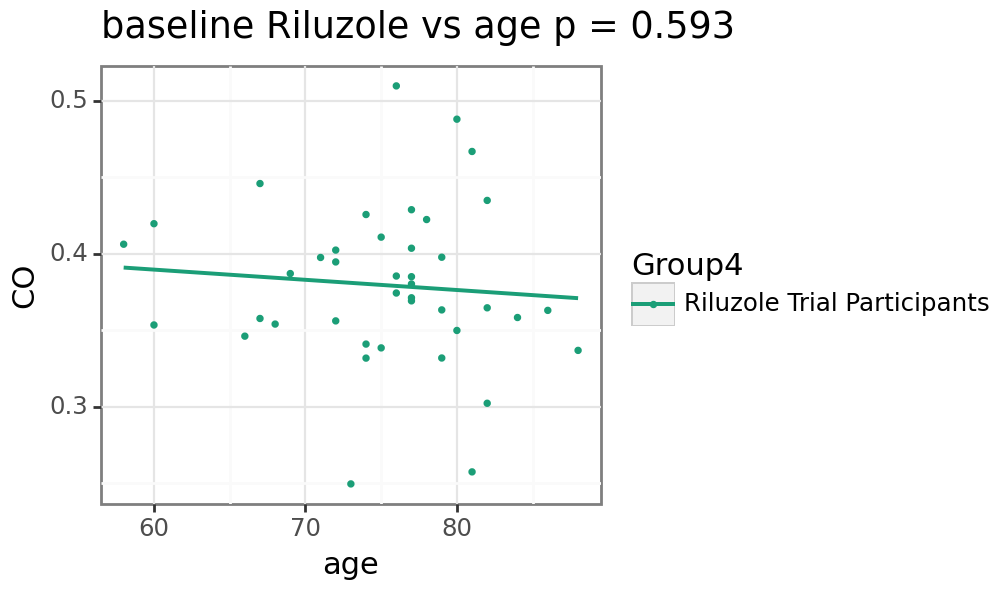

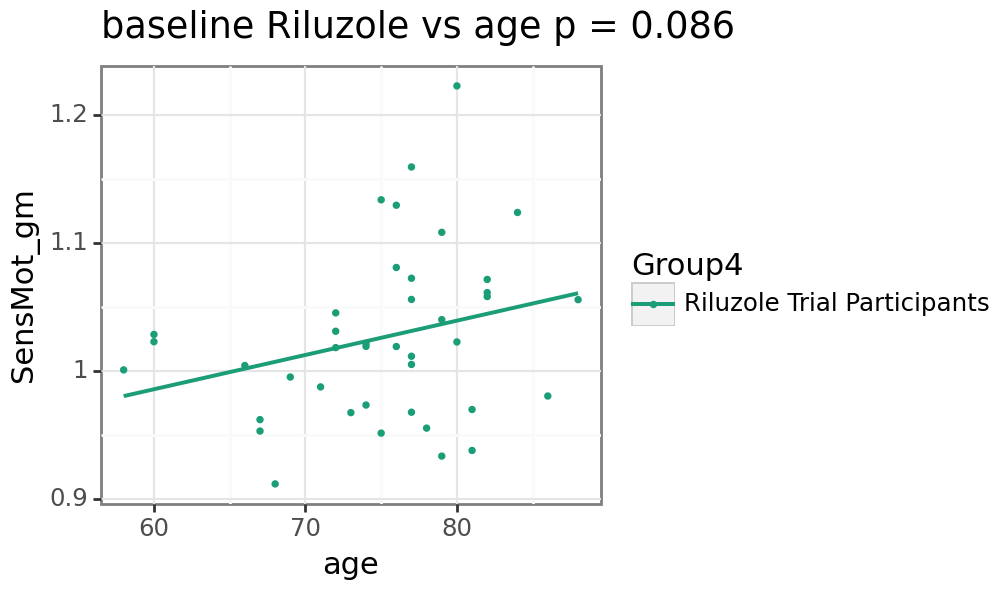

...

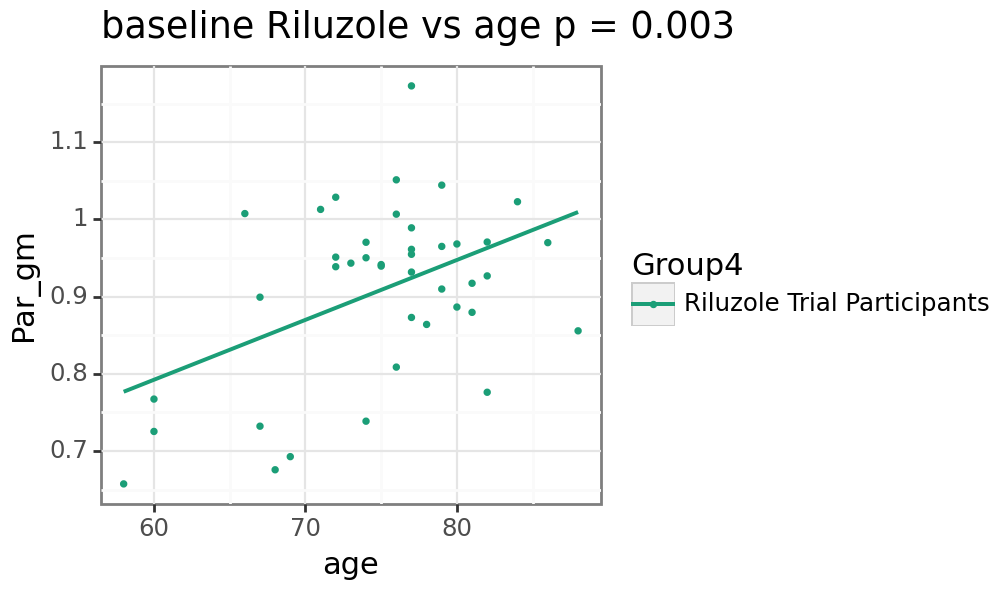

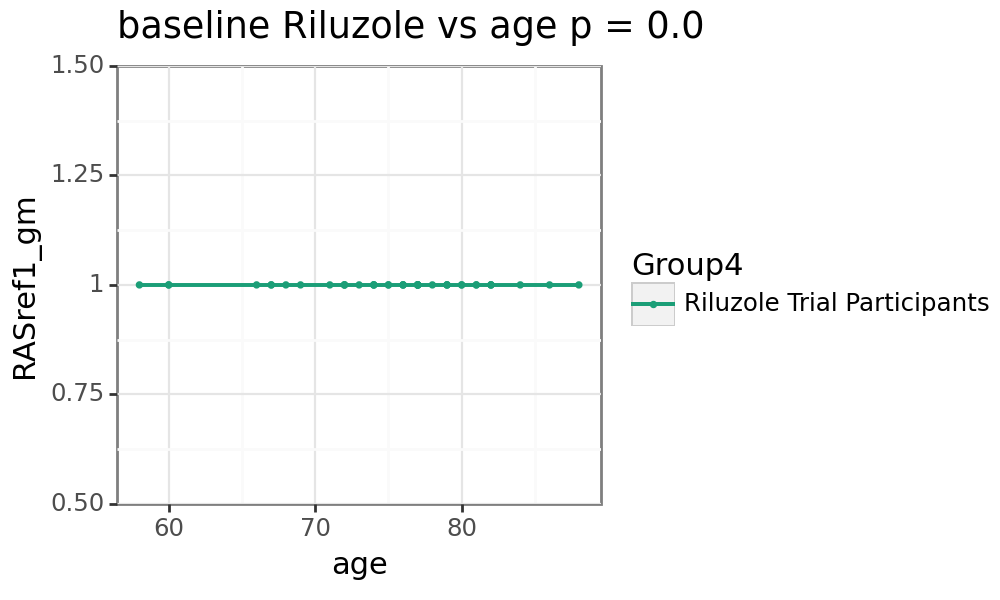

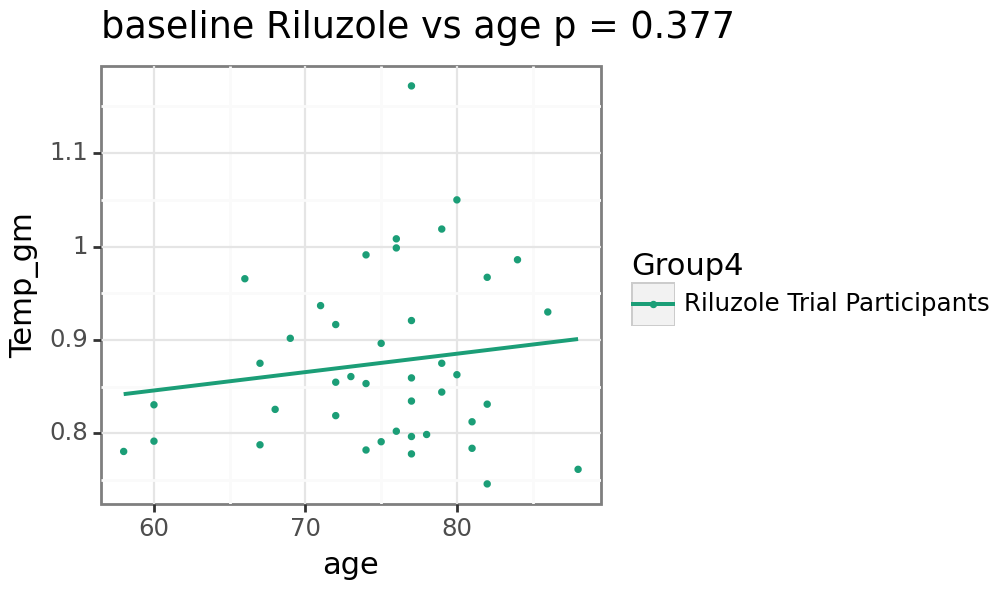

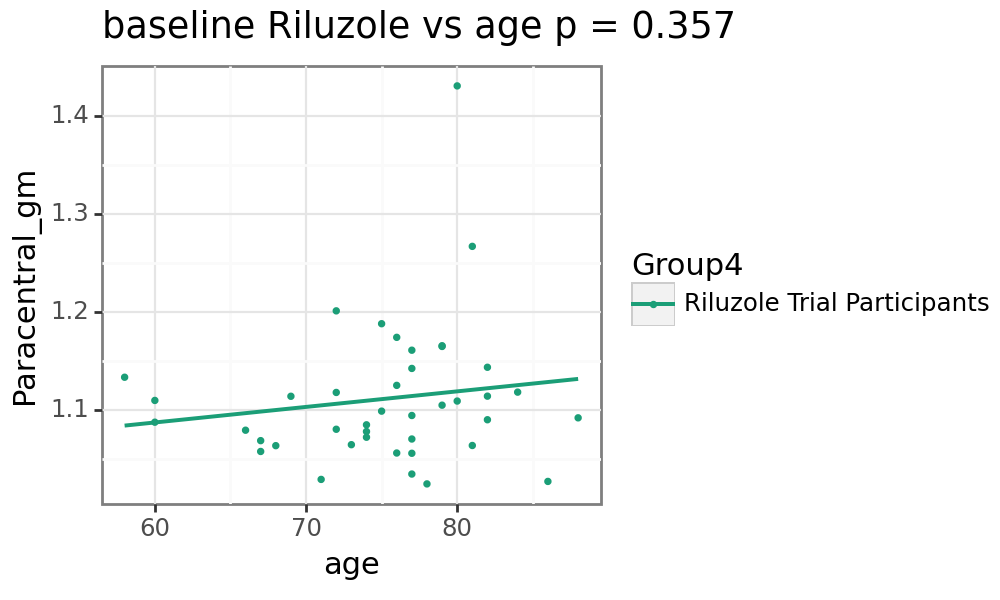

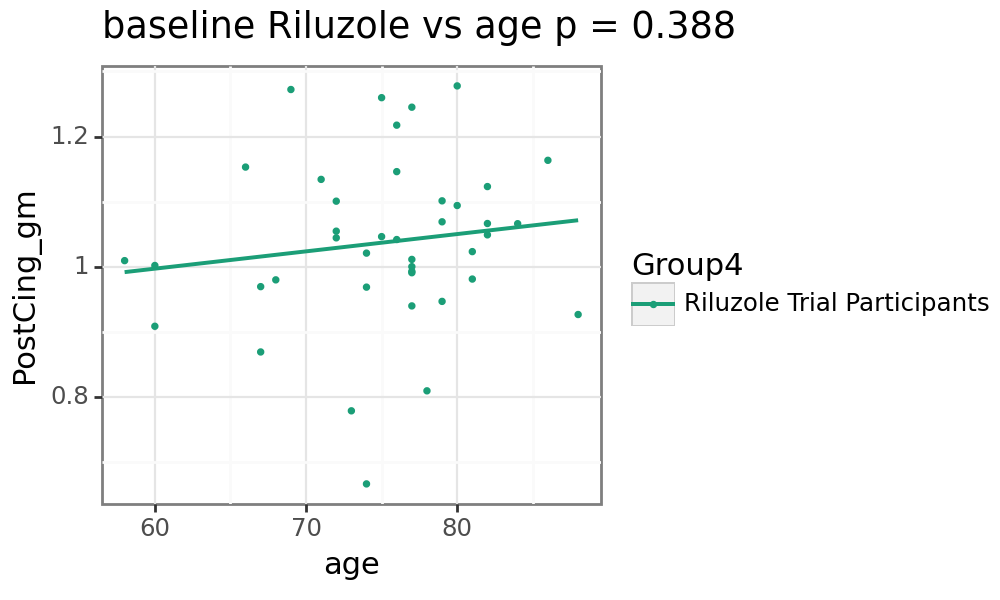

In [59]:
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_ras_new_merge.columns]:
    subset_data = data_FDG_rr_ras_new_merge.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group4'].notna()]
    subset_data = subset_data[subset_data['Group2'].isin(['Riluzole Trial Participants']) & subset_data['timepoint'].isin(['base'])]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Group4', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = subset_data).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['baseline Riluzole vs age p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group4'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_manual(['#1b9e77', '#d95f02', '#7570b3', '#737373'])

    )
    print(plot)

# Plasma and Covariate models
Men have higher plasma amyloid (reflecting less amyloid building up in brain)


## univariate

In [60]:
other_relationship_results = pd.DataFrame(columns = [
    'var1', 'var2',
 'lin_p_placebo', 
 'lin_p_baseline',
 'lin_p_plac_bl'
])

combinations = pd.DataFrame(list(itertools.product(plasma_columns + log10_plasma_columns, ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_placebo = placebo_data.dropna(subset = [var0, var1])
    temp_df_baseline =  baseline_data.dropna(subset = [var0, var1])
    temp_df_plac_bl = placebo_baseline_data.copy().dropna(subset = [var0, var1])

    # z-score data
    temp_df_placebo[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_placebo[[var0]])
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])
    temp_df_plac_bl[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_plac_bl[[var0]])


    # univariate linear model just within the placebo data
    model = smf.mixedlm(formula = var0 + ' ~ ' + var1, data = temp_df_placebo, groups= temp_df_placebo["ID_ADM"]).fit()
    lin_p_placebo = model.pvalues[1:-1].min()

    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()

    # univariate linear model just within the placebo data
    model = smf.mixedlm(formula = var0 + ' ~ ' + var1, data = temp_df_plac_bl, groups= temp_df_plac_bl["ID_ADM"]).fit()
    lin_p_plac_bl= model.pvalues[1:-1].min()
    
    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  [var0, var1, 
    lin_p_placebo, lin_p_baseline, lin_p_plac_bl] 

C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\3753221078.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\3753221078.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\3753221078.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

In [61]:
other_relationship_results.loc[(other_relationship_results[['lin_p_baseline']].min(axis = 1) < 0.05), :].sort_values(['var2', 'lin_p_plac_bl'])

,var1,var2,lin_p_placebo,lin_p_baseline,lin_p_plac_bl
67,Ab42_40_log10,sex,0.953663,0.044414,0.069762
12,Ab42_40,sex,0.892189,0.027030,0.077965


## combined

In [62]:
other_relationship_results_multi = pd.DataFrame(columns = [
    'var',
    'age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline', 'race1_baseline', 'race2_baseline',
])

combinations = pd.DataFrame(list(itertools.product(plasma_columns + log10_plasma_columns, ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for var in plasma_columns + log10_plasma_columns:
    temp_df_placebo = placebo_data.dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])
    temp_df_baseline =  baseline_data.dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])
    temp_df_plac_bl = placebo_baseline_data.copy().dropna(subset = [var,'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])

    # z-score data
    temp_df_placebo[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_placebo[[var, 'Education_years', 'age']])
    temp_df_baseline[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var, 'Education_years', 'age']])
    temp_df_plac_bl[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_plac_bl[[var, 'Education_years', 'age']])


    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']
    race1_baseline = model.pvalues['race[T.White/NH]']
    race2_baseline = np.nan #model.pvalues['race[T.Hispanic/Latino]']


    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  [var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline,race1_baseline, race2_baseline
    ] 

C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\1602665082.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\1602665082.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\1602665082.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

In [63]:
other_relationship_results_multi.loc[(other_relationship_results_multi[['age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline', 'race1_baseline', 'race2_baseline']].min(axis = 1) < 0.05), :]

,var,age_baseline,apoe4_carrier_baseline,sex_baseline,Education_years_baseline,race1_baseline,race2_baseline
2,Ab42_40,0.444618,0.867996,0.025657,0.785443,0.136829,NaN
13,Ab42_40_log10,0.603999,0.749925,0.045392,0.966836,0.112875,NaN


In [64]:
(other_relationship_results_multi[[ 
    'age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline', 'race1_baseline', 'race2_baseline',
]]<0.05).sum().sort_values()

age_baseline                0
apoe4_carrier_baseline      0
Education_years_baseline    0
race1_baseline              0
race2_baseline              0
sex_baseline                2
dtype: int64

## Sex Effects directionality


In [65]:
other_relationship_results_multi['var'].unique()

array(['Ab40', 'Ab42', 'Ab42_40', 'GFAP', 'NFL', 'pTau181', 'pTau217',
       'pTau231', 'pTau181_Ab42', 'GFAP_aa', 'NFL_aa', 'Ab40_log10',
       'Ab42_log10', 'Ab42_40_log10', 'GFAP_log10', 'NFL_log10',
       'pTau181_log10', 'pTau217_log10', 'pTau231_log10',
       'pTau181_Ab42_log10', 'GFAP_aa_log10', 'NFL_aa_log10'],
      dtype=object)

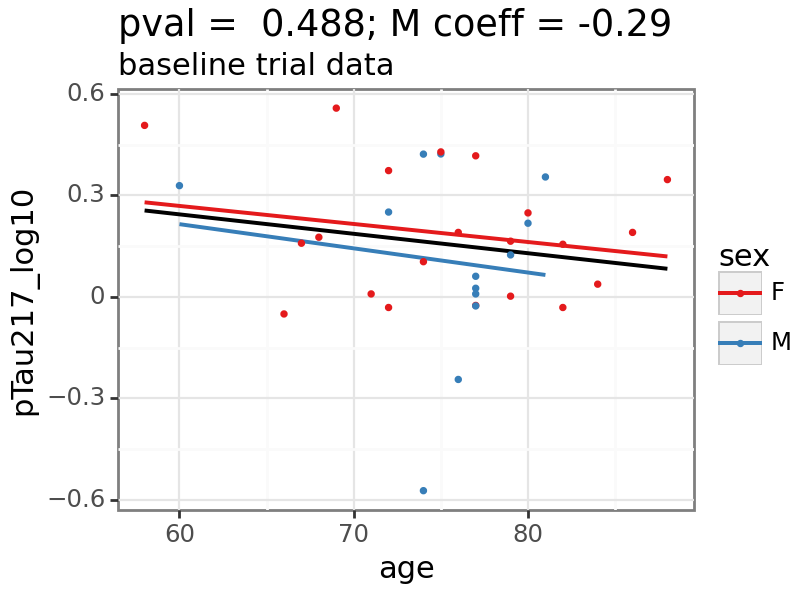

In [66]:
p9.options.figure_size = (4,3)   

var_list = ['pTau217_log10']
for var1 in var_list:
    p_value = other_relationship_results_multi.loc[
        other_relationship_results_multi['var'].isin([var1]) ,
         'sex_baseline'].reset_index(drop=True)[0].round(3).astype('str')

    subset_data = baseline_data.dropna(subset = ['age', 'sex', var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)

    # multivariate linear model just within the baseline datapoints of the trial data
    temp_df = subset_data.copy()
    temp_df[[var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df[[
        var1, 'Education_years', 'age']])    # z-score data        
    model = smf.ols(formula = var1 + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df).fit()
    coeff = model.params['sex[T.M]'].round(2).astype('str')

    
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var1, color = 'sex'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; M coeff = ' +coeff ), subtitle = 'baseline trial data')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

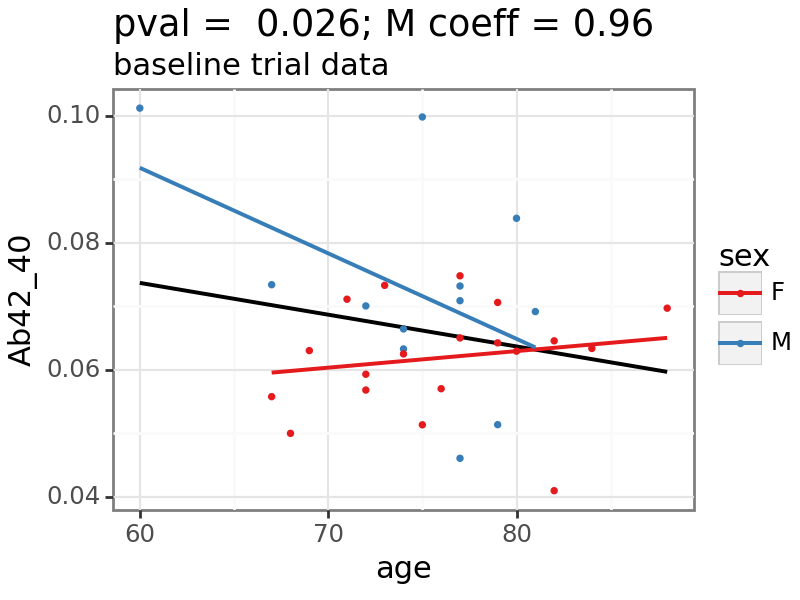

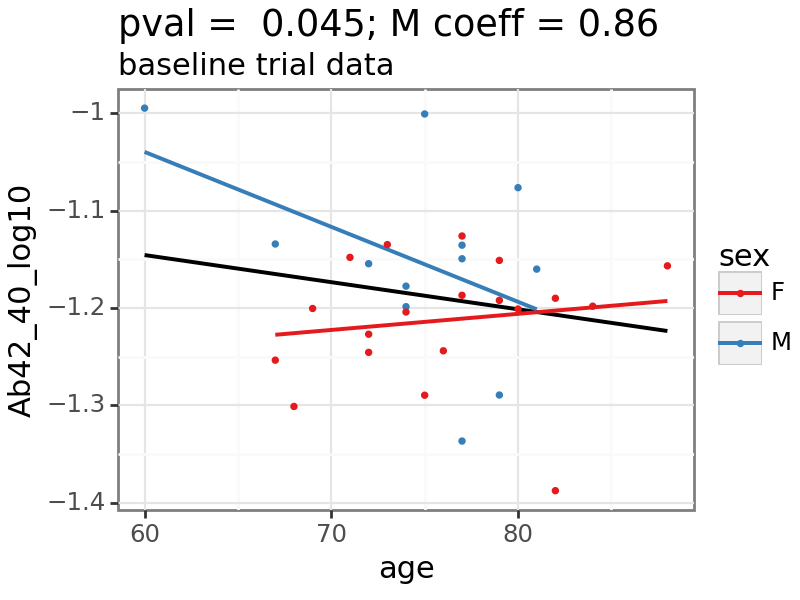

In [67]:
p9.options.figure_size = (4,3)   

var_list = other_relationship_results_multi.loc[(other_relationship_results_multi['sex_baseline']<0.05), 'var'].to_list()
for var1 in var_list:
    p_value = other_relationship_results_multi.loc[
        other_relationship_results_multi['var'].isin([var1]) ,
         'sex_baseline'].reset_index(drop=True)[0].round(3).astype('str')

    subset_data = baseline_data.dropna(subset = ['age', 'sex', var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)

    # multivariate linear model just within the baseline datapoints of the trial data
    temp_df = subset_data.copy()
    temp_df[[var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df[[
        var1, 'Education_years', 'age']])    # z-score data        
    model = smf.ols(formula = var1 + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df).fit()
    coeff = model.params['sex[T.M]'].round(2).astype('str')

    
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var1, color = 'sex'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; M coeff = ' +coeff ), subtitle = 'baseline trial data')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Volumetrics and Covariates models
older subjects have larger volumes (relative to their age) - reflects greater severity of early onset AD?  
subjects with more education have larger volumes - less education = AD risk factor
men have smaller volumes (for their head size & age)

## univariate

In [68]:
other_relationship_results = pd.DataFrame(columns = [
    'var1', 'var2',
 'lin_p_placebo', 
 'lin_p_baseline',
 'lin_p_plac_bl'
])

combinations = pd.DataFrame(list(itertools.product(vol_columns, ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_baseline =  baseline_data.dropna(subset = [var0, var1])

    # z-score data
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])




    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()
    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  [var0, var1, 
    np.nan, lin_p_baseline, np.nan] 

C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\1148305594.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\1148305594.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\1148305594.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

## combined

In [69]:
other_relationship_results_multi = pd.DataFrame(columns = [
    'var',
    'age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline', 'race_baseline'
])

for var in vol_columns:
    temp_df_placebo = placebo_data.dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])
    temp_df_baseline =  baseline_data.dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])
    temp_df_plac_bl = placebo_baseline_data.copy().dropna(subset = [var,'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])

    # z-score data
    temp_df_placebo[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_placebo[[var, 'Education_years', 'age']])
    temp_df_baseline[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var, 'Education_years', 'age']])
    temp_df_plac_bl[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_plac_bl[[var, 'Education_years', 'age']])


    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']
    race_baseline = model.pvalues['race[T.White/NH]']


    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  [var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline, race_baseline
    ] 

C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\3889675748.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\3889675748.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\5\ipykernel_21744\3889675748.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

In [70]:
(other_relationship_results_multi[[ 
    'age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline', 'race_baseline'
]]<0.05).sum().sort_values()

apoe4_carrier_baseline       0
race_baseline                0
Education_years_baseline     1
sex_baseline                 3
age_baseline                27
dtype: int64

## directionality - age

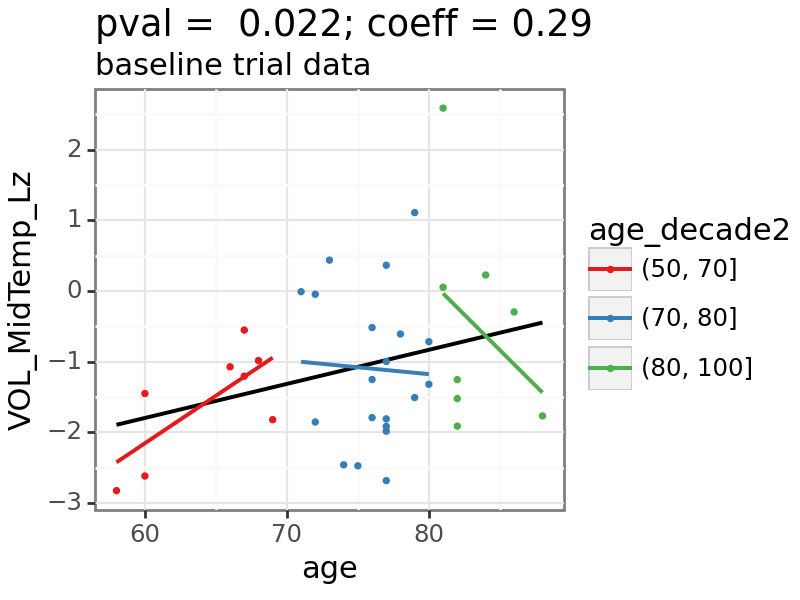

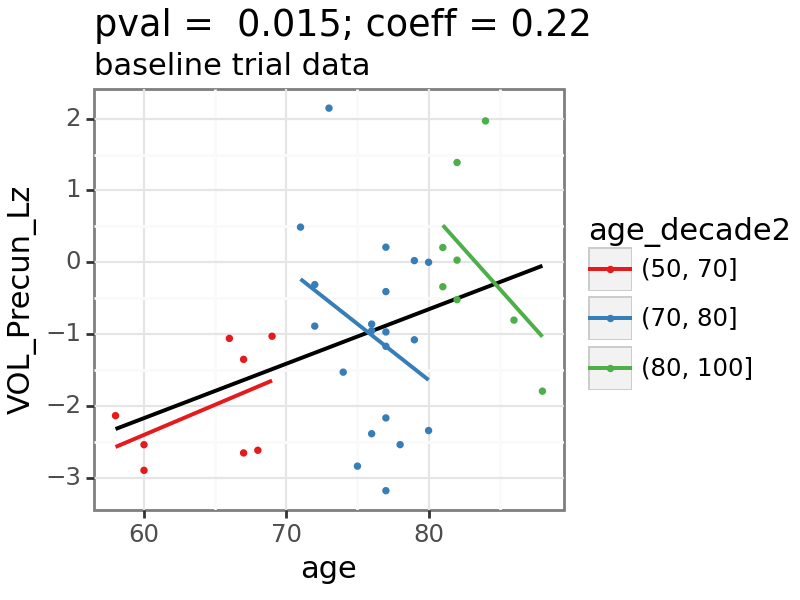

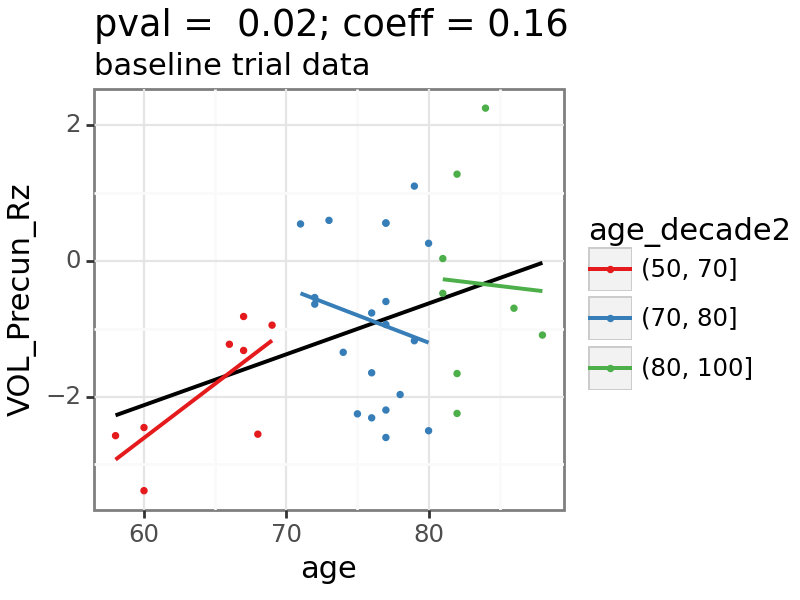

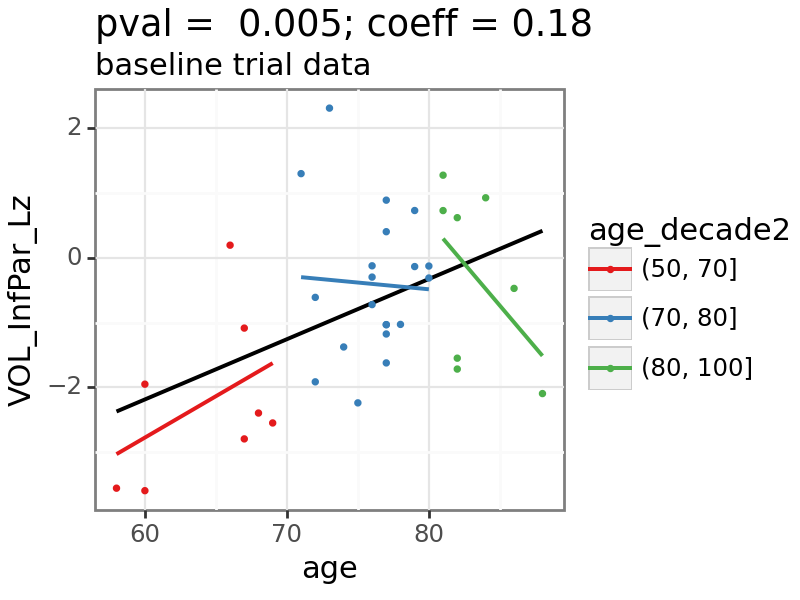

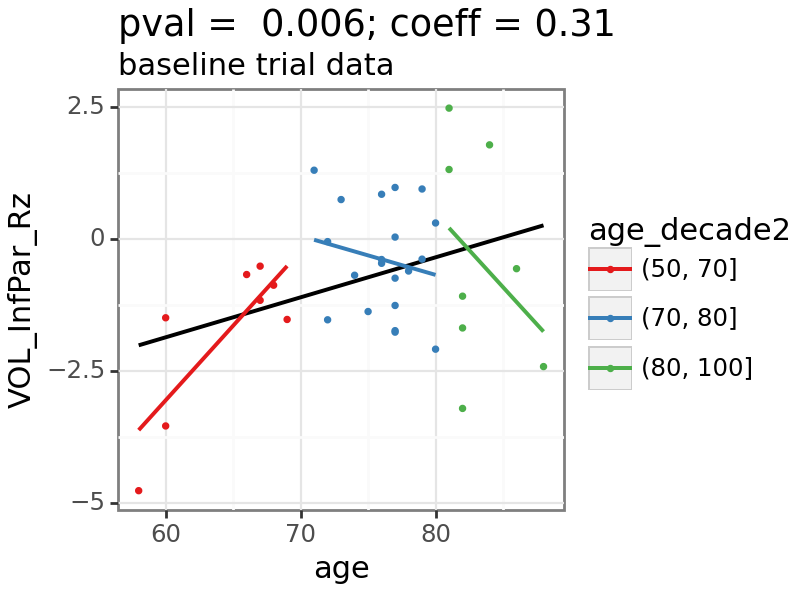

...

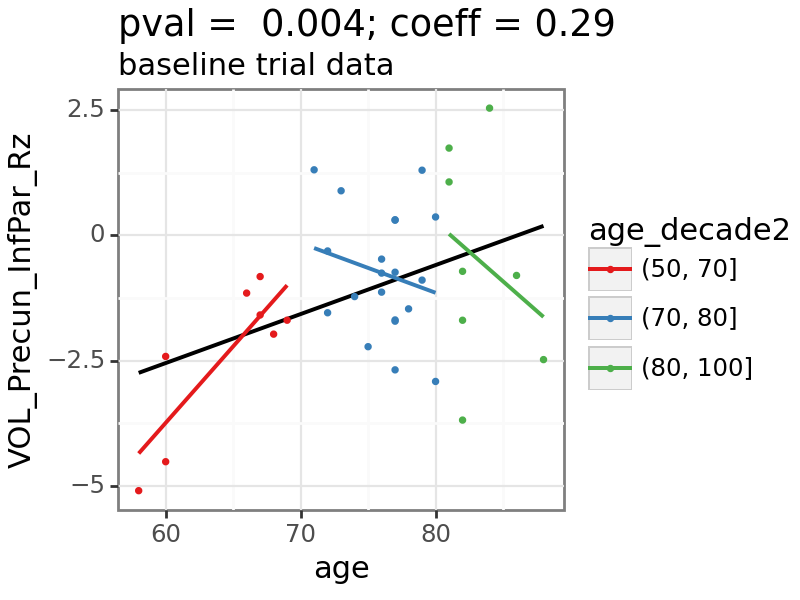

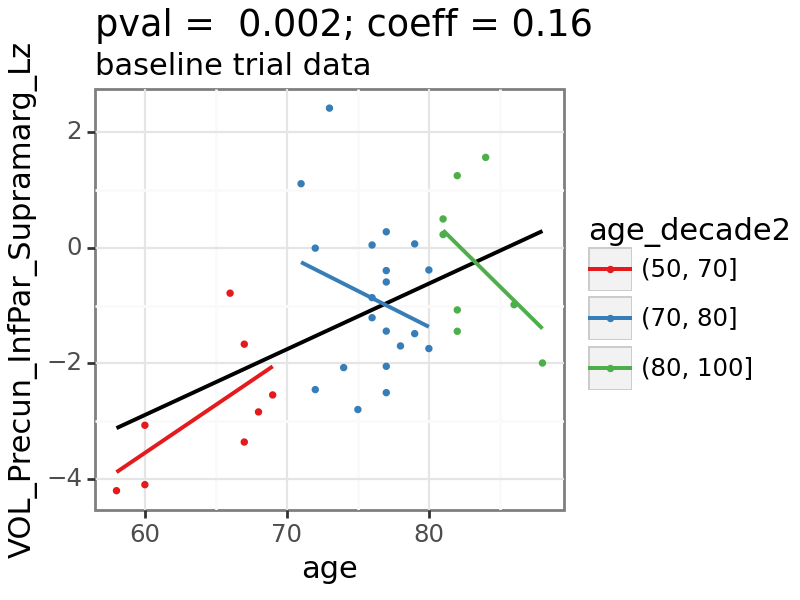

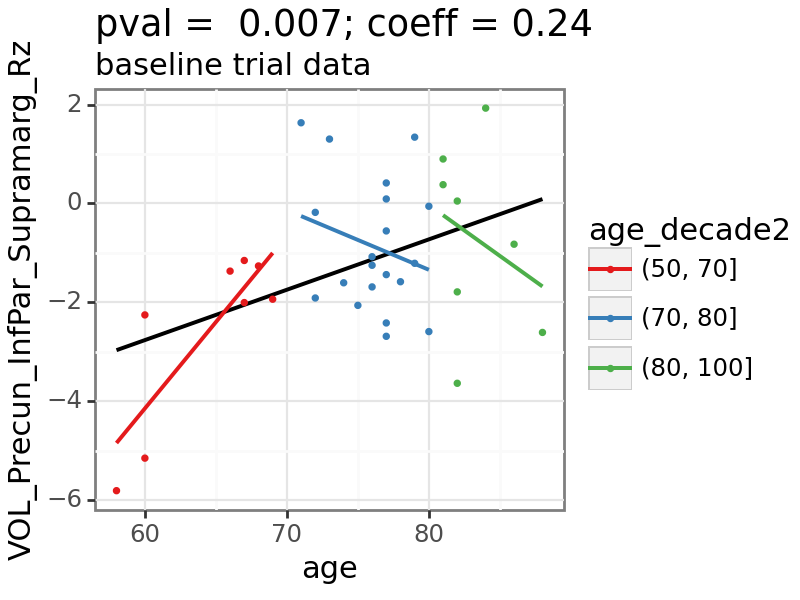

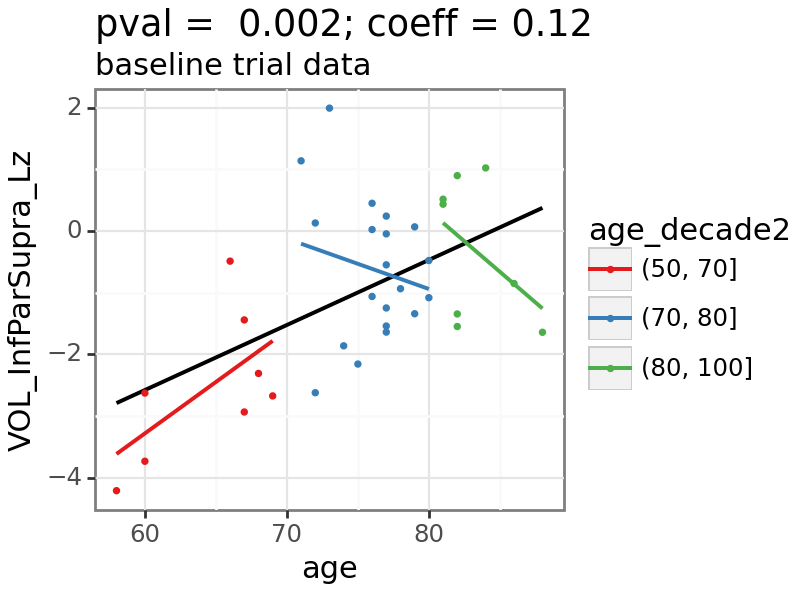

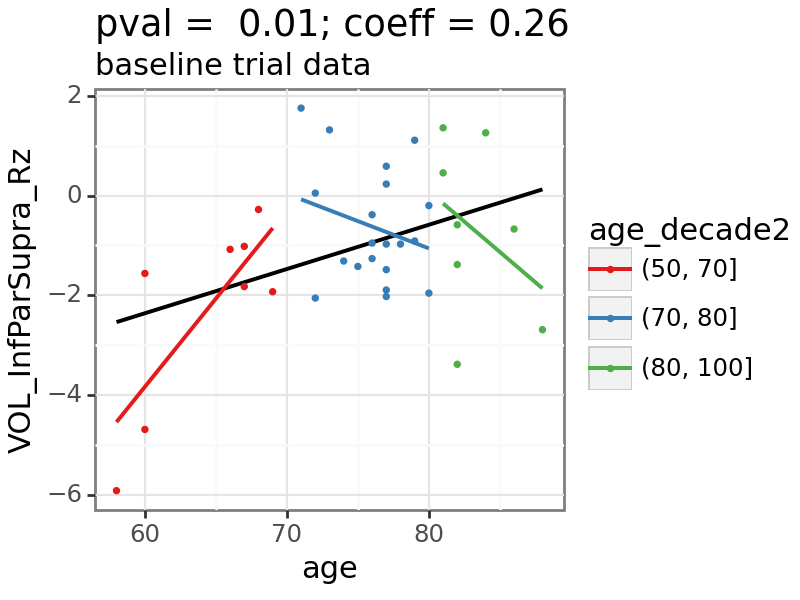

In [71]:
p9.options.figure_size = (4,3)   

var_list = other_relationship_results_multi.loc[(other_relationship_results_multi['age_baseline']<0.05), 'var'].to_list()
for var1 in var_list:
    p_value = other_relationship_results_multi.loc[
        other_relationship_results_multi['var'].isin([var1]) ,
         'age_baseline'].reset_index(drop=True)[0].round(3).astype('str')

    subset_data = baseline_data.dropna(subset = ['age', var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)

    # multivariate linear model just within the baseline datapoints of the trial data
    temp_df = subset_data.copy()
    temp_df[[var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df[[
        var1, 'Education_years', 'age']])    # z-score data        
    model = smf.ols(formula = var1 + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df).fit()
    coeff = model.params['Education_years'].round(2).astype('str')

    
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; coeff = ' +coeff ), subtitle = 'baseline trial data')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## directionality - education

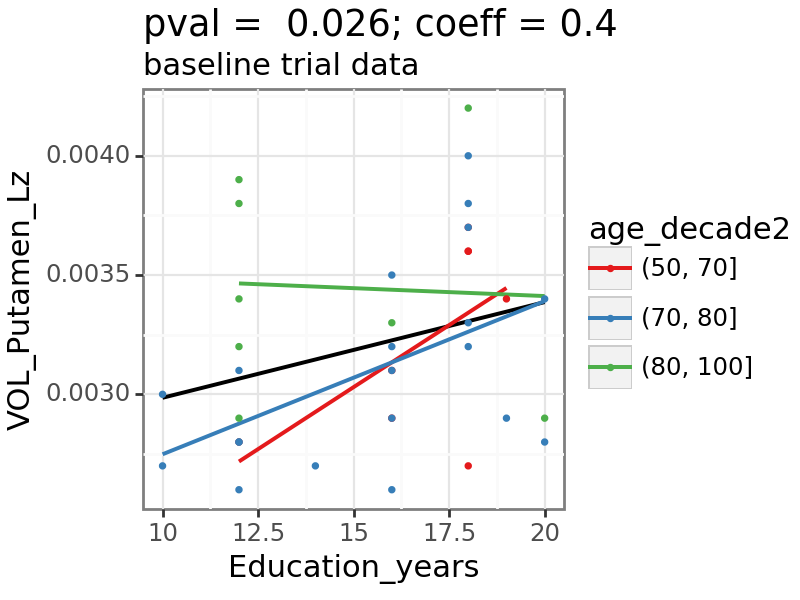

In [72]:
p9.options.figure_size = (4,3)   

var_list = other_relationship_results_multi.loc[(other_relationship_results_multi['Education_years_baseline']<0.05), 'var'].to_list()
for var1 in var_list:
    p_value = other_relationship_results_multi.loc[
        other_relationship_results_multi['var'].isin([var1]) ,
         'Education_years_baseline'].reset_index(drop=True)[0].round(3).astype('str')

    subset_data = baseline_data.dropna(subset = ['Education_years', var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)

    # multivariate linear model just within the baseline datapoints of the trial data
    temp_df = subset_data.copy()
    temp_df[[var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df[[
        var1, 'Education_years', 'age']])    # z-score data        
    model = smf.ols(formula = var1 + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df).fit()
    coeff = model.params['Education_years'].round(2).astype('str')


    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'Education_years', y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; coeff = ' +coeff ), subtitle = 'baseline trial data')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## directionality - sex

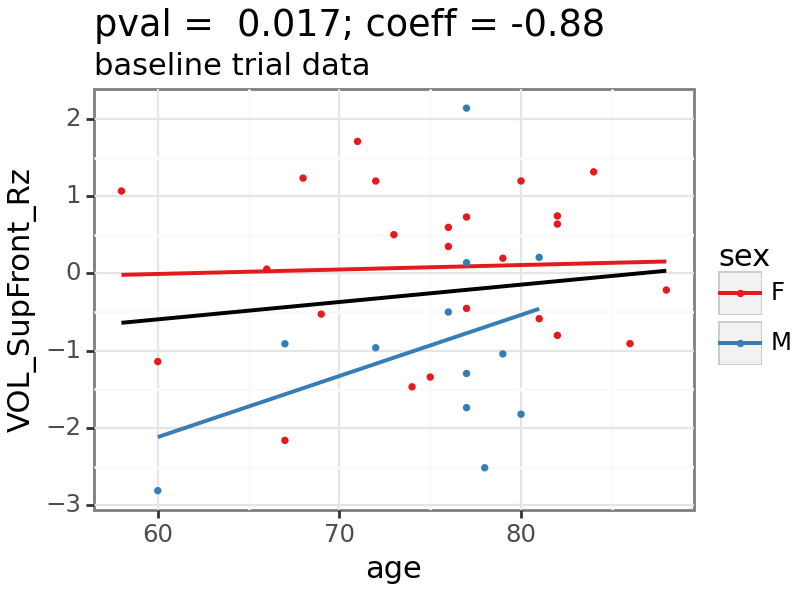

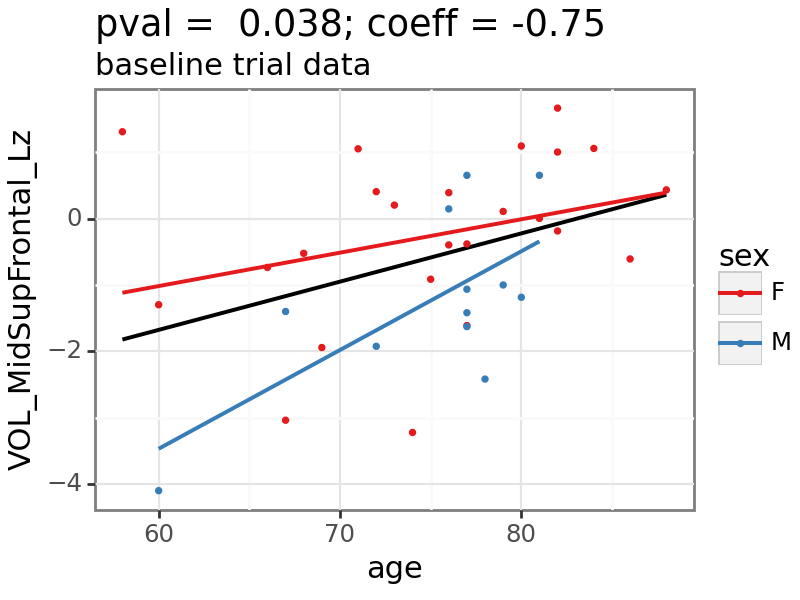

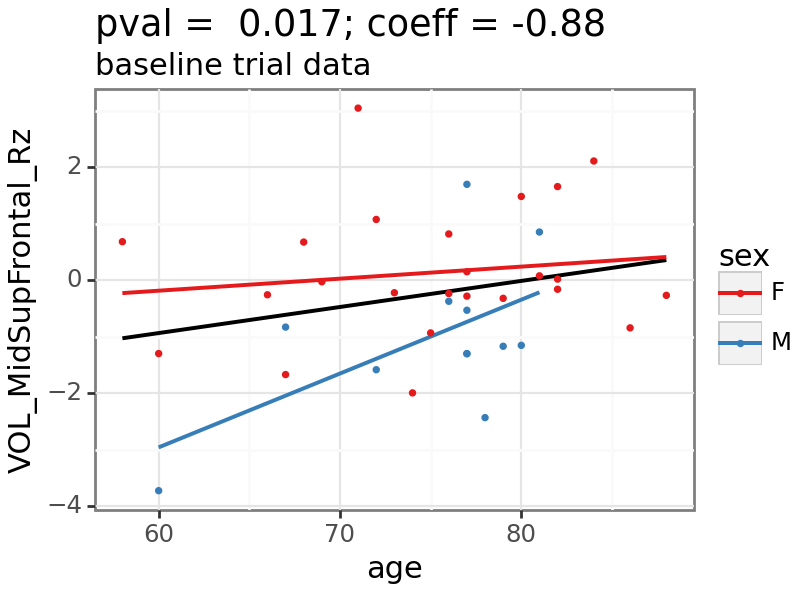

In [73]:
p9.options.figure_size = (4,3)   

var_list = other_relationship_results_multi.loc[(other_relationship_results_multi['sex_baseline']<0.05), 'var'].to_list()
for var1 in var_list:
    p_value = other_relationship_results_multi.loc[
        other_relationship_results_multi['var'].isin([var1]) ,
         'sex_baseline'].reset_index(drop=True)[0].round(3).astype('str')

    subset_data = baseline_data.dropna(subset = ['age', var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)

    # multivariate linear model just within the baseline datapoints of the trial data
    temp_df = subset_data.copy()
    temp_df[[var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df[[
        var1, 'Education_years', 'age']])    # z-score data        
    model = smf.ols(formula = var1 + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df).fit()
    coeff = model.params['sex[T.M]'].round(2).astype('str')

    
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var1, color = 'sex'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; coeff = ' +coeff ), subtitle = 'baseline trial data')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# FDG and Covariates Models
older = higher FDG (b/c young onset AD is more severe)  
more education = higher FDG (b/c of protective effects)  

## univariate

In [74]:
other_relationship_results = pd.DataFrame(columns = ['fdg_source', 'var1', 'var2', 'lin_p_baseline'])

#### data_FDG_rr_orig_merge ####
combinations = pd.DataFrame(list(itertools.product([ele for ele in FDG_columns if ele in data_FDG_rr_orig_merge.columns], ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_baseline =  data_FDG_rr_orig_merge[data_FDG_rr_orig_merge['timepoint'].isin(['base'])].dropna(subset = [var0, var1])

    # z-score data
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])

    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()

    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  ['data_FDG_rr_orig_merge', var0, var1, lin_p_baseline] 

#### data_FDG_rr_pons_merge ####
combinations = pd.DataFrame(list(itertools.product([ele for ele in FDG_columns if ele in data_FDG_rr_pons_merge.columns], ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_baseline =  data_FDG_rr_pons_merge[data_FDG_rr_pons_merge['timepoint'].isin(['base'])].dropna(subset = [var0, var1])

    # z-score data
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])

    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()

    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  ['data_FDG_rr_pons_merge', var0, var1, lin_p_baseline] 

#### data_FDG_rr_para_merge ####
combinations = pd.DataFrame(list(itertools.product([ele for ele in FDG_columns if ele in data_FDG_rr_para_merge.columns], ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_baseline =  data_FDG_rr_para_merge[data_FDG_rr_para_merge['timepoint'].isin(['base'])].dropna(subset = [var0, var1])

    # z-score data
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])

    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()

    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  ['data_FDG_rr_para_merge', var0, var1, lin_p_baseline] 

#### data_FDG_rr_para_new_merge ####
combinations = pd.DataFrame(list(itertools.product([ele for ele in FDG_columns if ele in data_FDG_rr_para_new_merge.columns], ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_baseline =  data_FDG_rr_para_new_merge[data_FDG_rr_para_new_merge['timepoint'].isin(['base'])].dropna(subset = [var0, var1])

    # z-score data
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])

    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()

    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  ['data_FDG_rr_para_new_merge', var0, var1, lin_p_baseline] 

#### data_FDG_rr_ras_new_merge ####
combinations = pd.DataFrame(list(itertools.product([ele for ele in FDG_columns if ele in data_FDG_rr_ras_new_merge.columns], ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_baseline =  data_FDG_rr_ras_new_merge[data_FDG_rr_ras_new_merge['timepoint'].isin(['base'])].dropna(subset = [var0, var1])

    # z-score data
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])

    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()

    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  ['data_FDG_rr_ras_new_merge', var0, var1, lin_p_baseline] 

In [75]:
other_relationship_results.groupby(['fdg_source', 'var2'])[['lin_p_baseline']].apply(lambda x: (x<0.05).sum()).reset_index().pivot(index='fdg_source', columns='var2', values='lin_p_baseline')


var2,Education_years,age,apoe4_carrier,race,sex
fdg_source,,,,,
data_FDG_rr_orig_merge,7,4,0,1,1
data_FDG_rr_para_merge,0,1,0,0,1
data_FDG_rr_para_new_merge,2,2,0,1,1
data_FDG_rr_pons_merge,0,1,2,0,3
data_FDG_rr_ras_new_merge,1,3,0,0,1


## combined

In [76]:
other_relationship_results_multi = pd.DataFrame(columns = ['fdg_source', 'var',
    'age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline', 'race_hisp_baseline', 'race_white_baseline'
])

race_hisp_baseline = np.nan 

#### data_FDG_rr_orig_merge ####
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_orig_merge.columns]:
    temp_df_baseline =  data_FDG_rr_orig_merge[data_FDG_rr_orig_merge['timepoint'].isin(['base'])].dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race',
     'Education_years'])

    # z-score data
    temp_df_baseline[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[
        var, 'Education_years', 'age']])

    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']
    #race_hisp_baseline = model.pvalues['race[T.Hispanic/Latino]']
    if 'race[T.White/NH]' in model.pvalues.index.to_list():
        race_white_baseline = model.pvalues['race[T.White/NH]']
    else:
        race_white_baseline = np.nan
        
    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  ['data_FDG_rr_orig_merge', var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline, race_hisp_baseline, race_white_baseline
   ] 

#### data_FDG_rr_pons_merge ####
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_pons_merge.columns]:
    temp_df_baseline =  data_FDG_rr_pons_merge[data_FDG_rr_pons_merge['timepoint'].isin(['base'])].dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 
    'Education_years'])

    # z-score data
    temp_df_baseline[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[
        var, 'Education_years', 'age']])

    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']
    #race_hisp_baseline = model.pvalues['race[T.Hispanic/Latino]']
    if 'race[T.White/NH]' in model.pvalues.index.to_list():
        race_white_baseline = model.pvalues['race[T.White/NH]']
    else:
        race_white_baseline = np.nan

    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  ['data_FDG_rr_pons_merge', var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline, race_hisp_baseline, race_white_baseline
   ] 

#### data_FDG_rr_para_merge ####
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_para_merge.columns]:
    temp_df_baseline =  data_FDG_rr_para_merge[data_FDG_rr_para_merge['timepoint'].isin(['base'])].dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 
    'Education_years'])

    # z-score data
    temp_df_baseline[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[
        var, 'Education_years', 'age']])

    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']
    #race_hisp_baseline = model.pvalues['race[T.Hispanic/Latino]']
    if 'race[T.White/NH]' in model.pvalues.index.to_list():
        race_white_baseline = model.pvalues['race[T.White/NH]']
    else:
        race_white_baseline = np.nan

    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  ['data_FDG_rr_para_merge', var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline, race_hisp_baseline, race_white_baseline
   ] 

#### data_FDG_rr_para_new_merge ####
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_para_new_merge.columns]:
    temp_df_baseline =  data_FDG_rr_para_new_merge[data_FDG_rr_para_new_merge['timepoint'].isin(['base'])].dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 
    'Education_years'])

    # z-score data
    temp_df_baseline[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[
        var, 'Education_years', 'age']])

    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']
    #race_hisp_baseline = model.pvalues['race[T.Hispanic/Latino]']
    if 'race[T.White/NH]' in model.pvalues.index.to_list():
        race_white_baseline = model.pvalues['race[T.White/NH]']
    else:
        race_white_baseline = np.nan

    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  ['data_FDG_rr_para_new_merge', var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline, race_hisp_baseline, race_white_baseline
   ] 

#### data_FDG_rr_ras_new_merge ####
for var in [ele for ele in FDG_columns if ele in data_FDG_rr_ras_new_merge.columns]:
    temp_df_baseline =  data_FDG_rr_ras_new_merge[data_FDG_rr_ras_new_merge['timepoint'].isin(['base'])].dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race',
     'Education_years'])

    # z-score data
    temp_df_baseline[[var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[
        var, 'Education_years', 'age']])

    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']
    #race_hisp_baseline = model.pvalues['race[T.Hispanic/Latino]']
    if 'race[T.White/NH]' in model.pvalues.index.to_list():
        race_white_baseline = model.pvalues['race[T.White/NH]']
    else:
        race_white_baseline = np.nan

    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  ['data_FDG_rr_ras_new_merge', var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline, race_hisp_baseline, race_white_baseline
   ] 

In [77]:
(other_relationship_results_multi[['age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline','race_hisp_baseline', 'race_white_baseline'
]]<0.05).sum().sort_values()

race_hisp_baseline           0
race_white_baseline          0
apoe4_carrier_baseline       1
sex_baseline                 3
age_baseline                 9
Education_years_baseline    13
dtype: int64

In [78]:
other_relationship_results_multi.groupby('fdg_source')[['age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline', 'race_hisp_baseline', 'race_white_baseline'
]].apply(lambda x: (x<0.05).sum()).reset_index()


,fdg_source,age_baseline,apoe4_carrier_baseline,sex_baseline,Education_years_baseline,race_hisp_baseline,race_white_baseline
0,data_FDG_rr_orig_merge,3,0,0,8,0,0
1,data_FDG_rr_para_merge,1,0,1,0,0,0
2,data_FDG_rr_para_new_merge,2,0,0,5,0,0
3,data_FDG_rr_pons_merge,0,1,2,0,0,0
4,data_FDG_rr_ras_new_merge,3,0,0,0,0,0


## age directionality



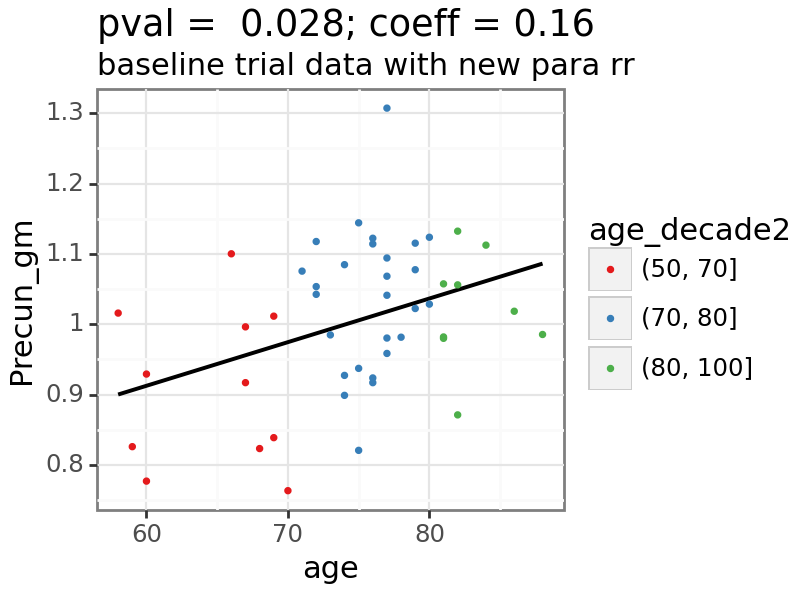

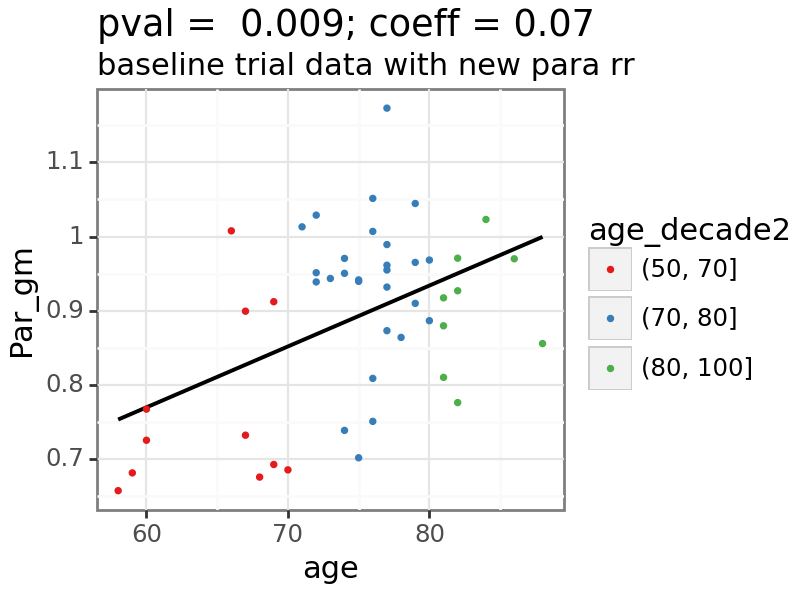

In [79]:
p9.options.figure_size = (4,3)   

var_list = other_relationship_results_multi.loc[other_relationship_results_multi['fdg_source'].isin(['data_FDG_rr_para_new_merge']) & (other_relationship_results_multi['age_baseline']<0.05), 'var'].to_list()
for var1 in var_list:
    p_value = other_relationship_results_multi.loc[
        other_relationship_results_multi['var'].isin([var1]) & other_relationship_results_multi['fdg_source'].isin(['data_FDG_rr_para_new_merge']),
         'age_baseline'].reset_index(drop=True)[0].round(3).astype('str')

    subset_data = data_FDG_rr_ras_new_merge[data_FDG_rr_ras_new_merge['timepoint'].isin(['base'])].dropna(subset = ['age', var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)

    # multivariate linear model just within the baseline datapoints of the trial data
    temp_df = subset_data.copy()
    temp_df[[var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df[[
        var1, 'Education_years', 'age']])    # z-score data        
    model = smf.ols(formula = var1 + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df).fit()
    coeff = model.params['Education_years'].round(2).astype('str')


    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; coeff = ' +coeff), subtitle = 'baseline trial data with new para rr')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## education directionality

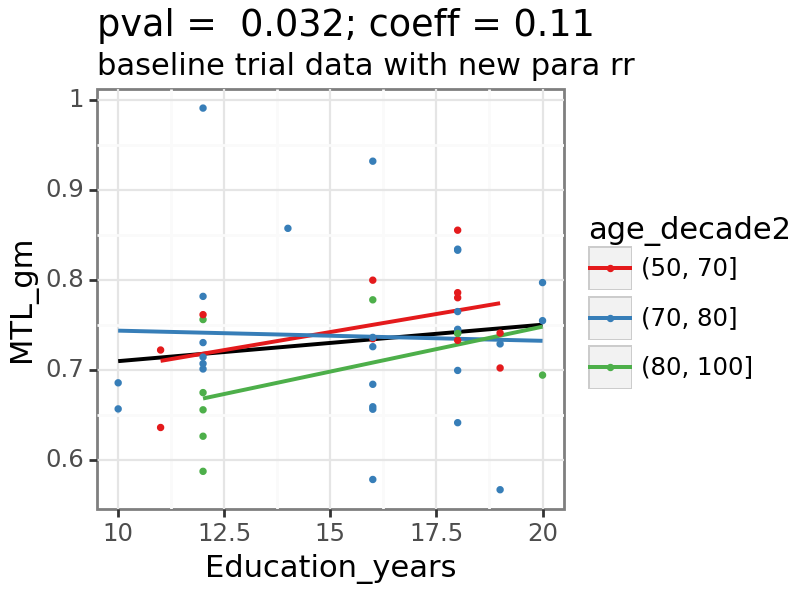

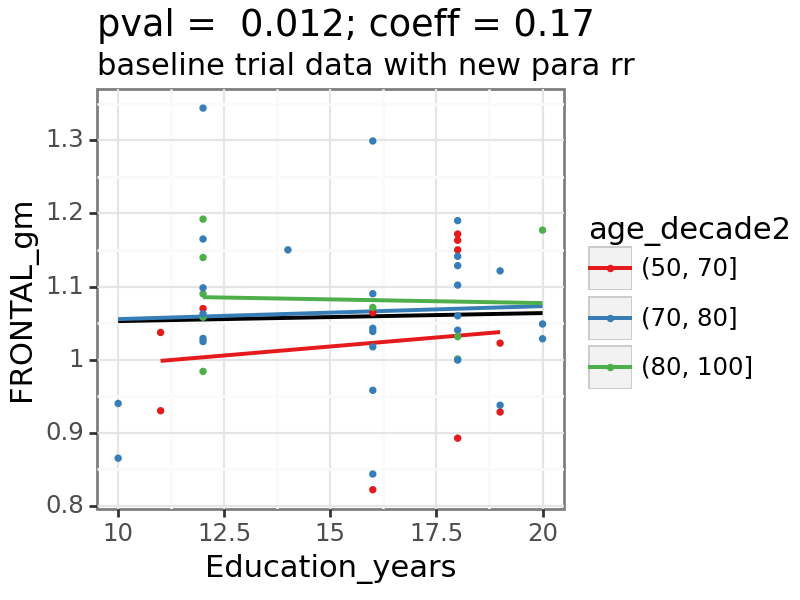

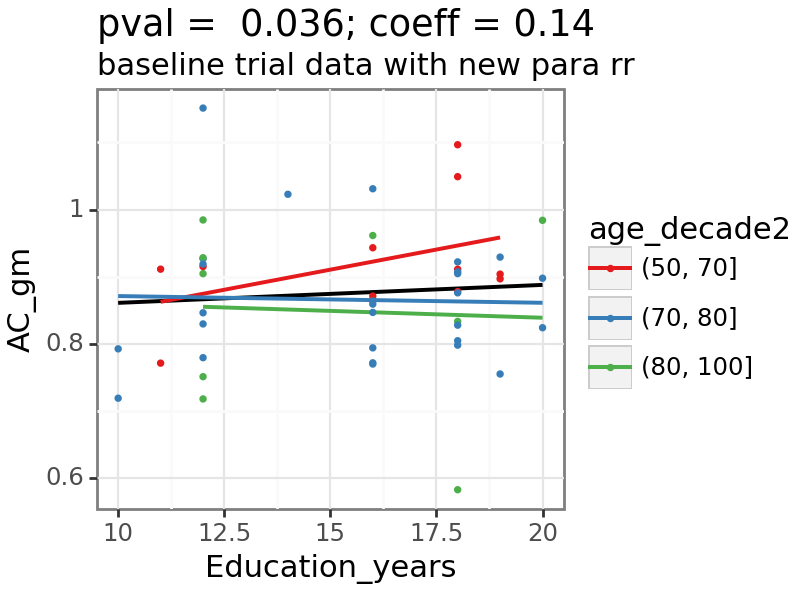

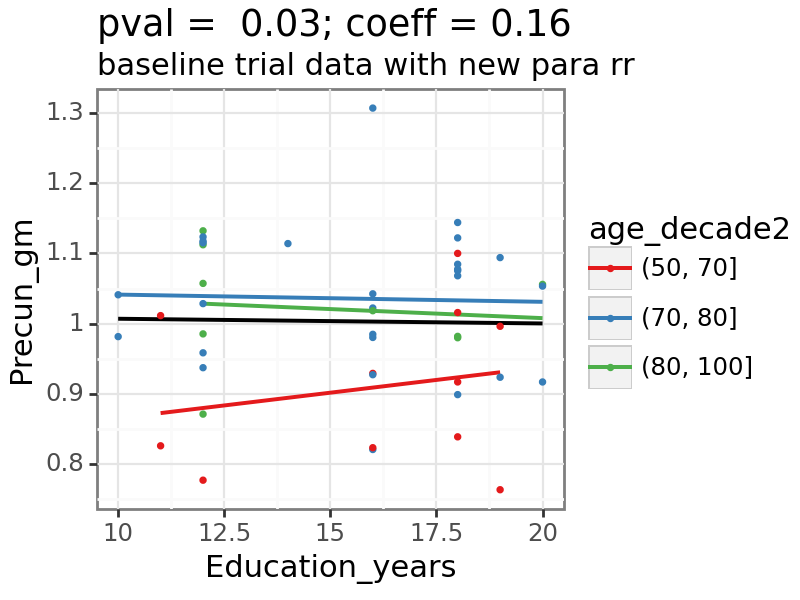

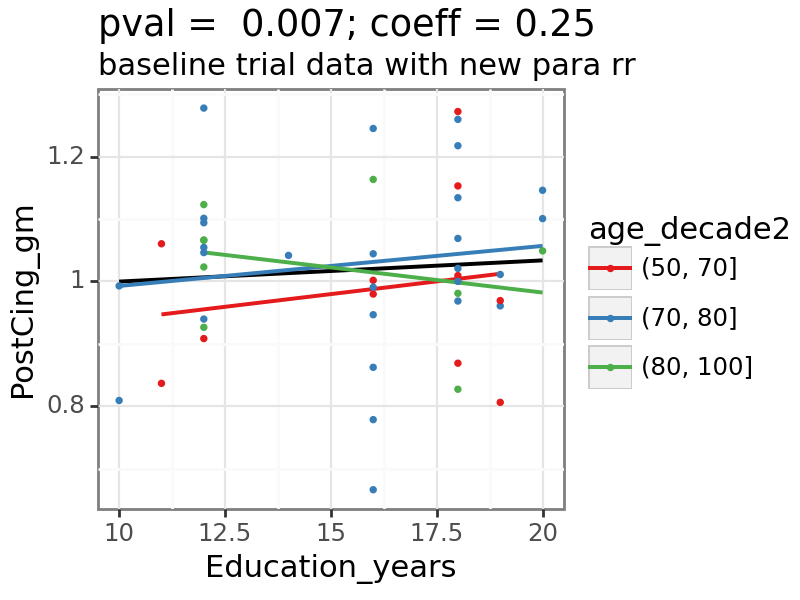

In [80]:
var_list = other_relationship_results_multi.loc[other_relationship_results_multi['fdg_source'].isin(['data_FDG_rr_para_new_merge']) & (other_relationship_results_multi['Education_years_baseline']<0.05), 'var'].to_list()
for var1 in var_list:
    p_value = other_relationship_results_multi.loc[
        other_relationship_results_multi['var'].isin([var1]) & other_relationship_results_multi['fdg_source'].isin(['data_FDG_rr_para_new_merge']),
         'Education_years_baseline'].reset_index(drop=True)[0].round(3).astype('str')

    subset_data = data_FDG_rr_ras_new_merge[data_FDG_rr_ras_new_merge['timepoint'].isin(['base'])].dropna(subset = ['Education_years', var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)


    # multivariate linear model just within the baseline datapoints of the trial data
    temp_df = subset_data.copy()
    temp_df[[var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df[[
        var1, 'Education_years', 'age']])    # z-score data        
    model = smf.ols(formula = var1 + ' ~ age + apoe4_carrier + sex + Education_years + race', data = temp_df).fit()
    coeff = model.params['Education_years'].round(2).astype('str')

    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'Education_years', y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; coeff = ' +coeff ), subtitle = 'baseline trial data with new para rr')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )

    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'Education_years', y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + '; coeff = ' +coeff ), subtitle = 'baseline trial data with new para rr')
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )

    print(plot)